<font size=14><center><b>Approches de modélisation</b></center></font>

# Imports

In [1]:
#!pip install yellowbrick

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from datetime import datetime
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import sqlite3

from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import  MinMaxScaler, scale

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer


# Fonctions

In [3]:
def CreationDir(dossier):
    """
    Crée le répertoire si il n'existe pas
    """
    if not os.path.exists(dossier):
        os.makedirs(dossier)



def analysDist(analyzeData,titre=0):
    """
    *  Fonction pour grapher les distributions des variables d'un dataframe
    *  analyzeData = nom du dataframe a analyser
    *  titre = titre du graph général
    """
    variables = len(analyzeData.columns)
    plt.figure(figsize = (10, (variables*3 + 1)))
    colorGroup = sns.color_palette("hls", variables)
    if titre != 0 :
        plt.suptitle(titre, fontsize=14, va='center', y=0.93)
    for i in range(0,variables):
        plt.subplot(variables, 3, 3*i+1)
        plt.subplots_adjust(hspace = 0.3)
        sns.histplot(analyzeData.iloc[:,i], bins=20, color=colorGroup[i])
        plt.xlabel('');plt.ylabel('')
        plt.subplot(variables, 3, 3*i+2)
        plt.title('Distribution '+str(analyzeData.iloc[:,i].name))
        sns.violinplot(analyzeData.iloc[:,i], orient='h', color=colorGroup[i])
        plt.xlabel('');plt.ylabel('')
        plt.subplot(variables, 3, 3*(i+1))
        sns.boxplot(analyzeData.iloc[:,i], orient='h', color=colorGroup[i])
        plt.xlabel('');plt.ylabel('')
    if titre != 0 :
        plt.savefig(dossierImage+titre+'.jpg')
    plt.show()



def plotData(df,x,y,colors=0,titre=0):
    """
    *  Fonction pour grapher les nuages de points d'un dataframe
    *  df = nom du dataframe
    *  x = variable x
    *  y = variable y
    *  c = array des couleurs si besoin
    *  titre = titre du graph général
    """
    #if c != 0 :
    #    c = ', c='
    plt.figure(figsize=(10,10))
    if colors != 0:
        sns.scatterplot(data=df, x=x, y=y, s=85, alpha=0.8, c=colors)
    else :
        sns.scatterplot(data=df, x=x, y=y, s=85, alpha=0.8)

    if titre != 0:
        plt.title(titre, fontsize=14)
        plt.savefig(dossierImage+titre+'.jpg')
    plt.show()



def plotDataComp(df,graph1,graph2,colors=0,titre=0):
    """
    *  Fonction pour grapher les nuages de points d'un dataframe
    *  df = nom du dataframe
    *  graph1 = variables graph1 ['x','y']
    *  graph2 = variables graph2 ['x','y']
    *  c = array des couleurs si besoin
    *  titre = titre du graph général
    """
    #if c != 0 :
    #    c = ', c='
    plt.figure(figsize=(10, 4))
    if titre != 0:
            plt.suptitle(titre, fontsize=14, va='center', y=0.93)
    if colors != 0:
        plt.subplot(1, 2, 1)
        plt.xlim(-0.1, 1.1)
        plt.ylim(-0.1, 1.1)
        sns.scatterplot(data=df, x=graph1[0], y=graph1[1],
                        s=85, alpha=0.8, c=colors)
        plt.subplot(1, 2, 2)
        plt.xlim(-0.1, 1.1)
        plt.ylim(-0.1, 1.1)
        sns.scatterplot(data=df, x=graph2[0], y=graph2[1],
                        s=85, alpha=0.8, c=colors)
    else:
        plt.subplot(1, 2, 1)
        plt.xlim(-0.1, 1.1)
        plt.ylim(-0.1, 1.1)
        sns.scatterplot(data=df, x=graph1[0], y=graph1[1], s=85, alpha=0.8)
        plt.subplot(1, 2, 2)
        plt.xlim(-0.1, 1.1)
        plt.ylim(-0.1, 1.1)
        sns.scatterplot(data=df, x=graph2[0], y=graph2[1], s=85, alpha=0.8)

    if titre != 0:
        #plt.title(titre, fontsize=14)
        plt.savefig(dossierImage+titre+'.jpg')
    plt.show()


# Constantes

In [4]:
dossierImage = "images/"  # chemin ou déposer les images
CreationDir(dossierImage)
dossierDatas = "datas/"   # chemin ou déposer les exports
CreationDir(dossierDatas)

In [5]:
# date d'execution du notebook pour pallier a l'ancienneté de la base
CURENT_DATE = "2018-10-18"

# Récupération du DataFrame

In [6]:
# Chargement des données
df = pd.read_csv(dossierDatas+'df.csv', sep='|',
                 lineterminator='\n', encoding='utf-8')

# Premier modèle (Retard des commandes en fonction de la localisation gps)

In [7]:
X = df[['lat','lng','retard_moy']].values
print(X.shape)

(96096, 3)


In [8]:
impute = SimpleImputer(missing_values=np.nan, strategy='mean')
X_imputed = impute.fit_transform(X)
X_norm = scale(X_imputed)
X_minmax = MinMaxScaler().fit_transform(X_imputed)
print(X_norm.shape)

(96096, 3)


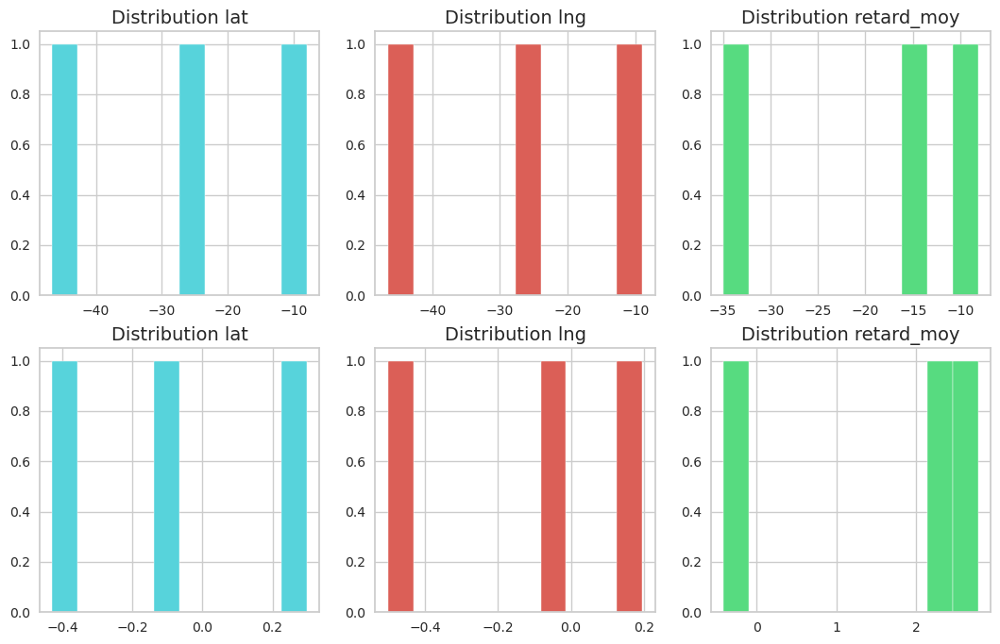

In [9]:
sns.set_style("whitegrid")
fig = plt.figure(figsize=(13,8))
ax1 = fig.add_subplot(2,3,1)
plt.title("Distribution lat", fontsize=14)
hist = plt.hist(X[0], color='#57D3DB')
ax1 = fig.add_subplot(2,3,2)
plt.title("Distribution lng", fontsize=14)
hist = plt.hist(X[1], color='#DB5F57')
ax1 = fig.add_subplot(2,3,3)
plt.title("Distribution retard_moy", fontsize=14)
hist = plt.hist(X[2], color='#57DB80')
ax1 = fig.add_subplot(2,3,4)
plt.title("Distribution lat", fontsize=14)
hist = plt.hist(X_norm[0], color='#57D3DB')
ax1 = fig.add_subplot(2,3,5)
plt.title("Distribution lng", fontsize=14)
hist = plt.hist(X_norm[1], color='#DB5F57')
ax1 = fig.add_subplot(2,3,6)
plt.title("Distribution retard_moy", fontsize=14)
hist = plt.hist(X_norm[2], color='#57DB80')
plt.savefig(dossierImage+'distributionR-F-M.jpg')

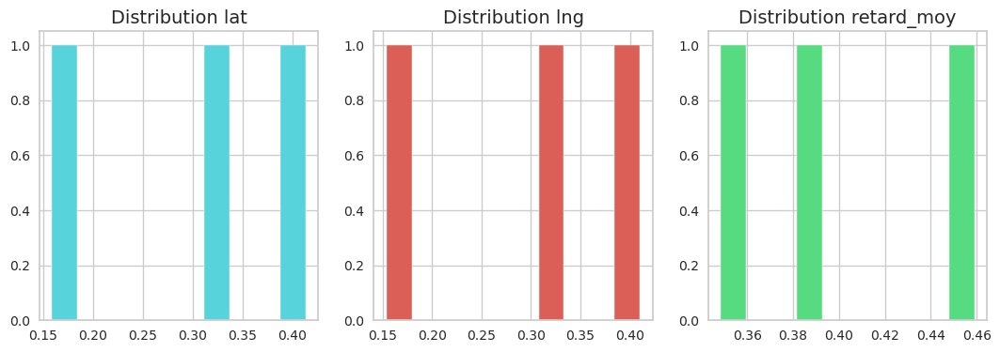

In [10]:
sns.set_style("whitegrid")
fig = plt.figure(figsize=(13,4))
ax1 = fig.add_subplot(1,3,1)
plt.title("Distribution lat", fontsize=14)
hist = plt.hist(X_minmax[0], color='#57D3DB')
ax1 = fig.add_subplot(1,3,2)
plt.title("Distribution lng", fontsize=14)
hist = plt.hist(X_minmax[1], color='#DB5F57')
ax1 = fig.add_subplot(1,3,3)
plt.title("Distribution retard_moy", fontsize=14)
hist = plt.hist(X_minmax[2], color='#57DB80')


In [11]:
X

array([[-23.62902711, -46.64547842,  -8.        ],
       [-24.03385564, -46.51618364,  -9.        ],
       [ -8.13138267, -34.90623286, -15.        ],
       ...,
       [-27.56152179, -48.63735431,  -1.        ],
       [-23.56811877, -46.79298137,  -4.        ],
       [-23.35345265, -46.82306011,  -4.        ]])

In [12]:
X_norm

array([[-0.42924717, -0.11418084,  0.29752492],
       [-0.50137369, -0.08233028,  0.19587575],
       [ 2.33190021,  2.77767288, -0.41401925],
       ...,
       [-1.12988251, -0.6048609 ,  1.00906908],
       [-0.4183954 , -0.15051682,  0.70412158],
       [-0.38014928, -0.15792643,  0.70412158]])

In [13]:
X_minmax[:,0]

array([0.15888502, 0.15392822, 0.34864131, ..., 0.11073476, 0.15963079,
       0.16225921])

## Determination du k

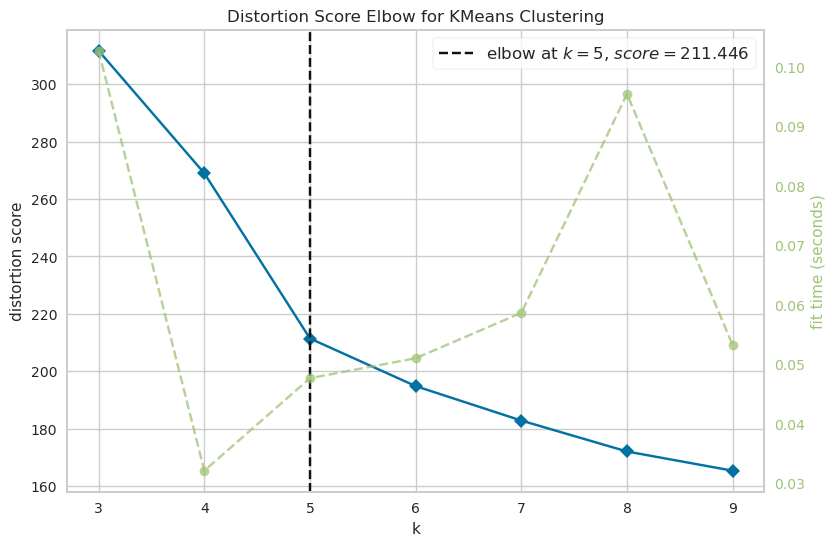

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [14]:
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
mpl.rcParams["figure.figsize"] = (9,6)
# Instantiate the clustering model and visualizer
model = KMeans(n_init=1, init='random', random_state=42)
visualizer = KElbowVisualizer(model, k=(3,10))
#visualizer = KElbowVisualizer(model)
#print(visualizer.get_params().keys())
visualizer.fit(X_minmax)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

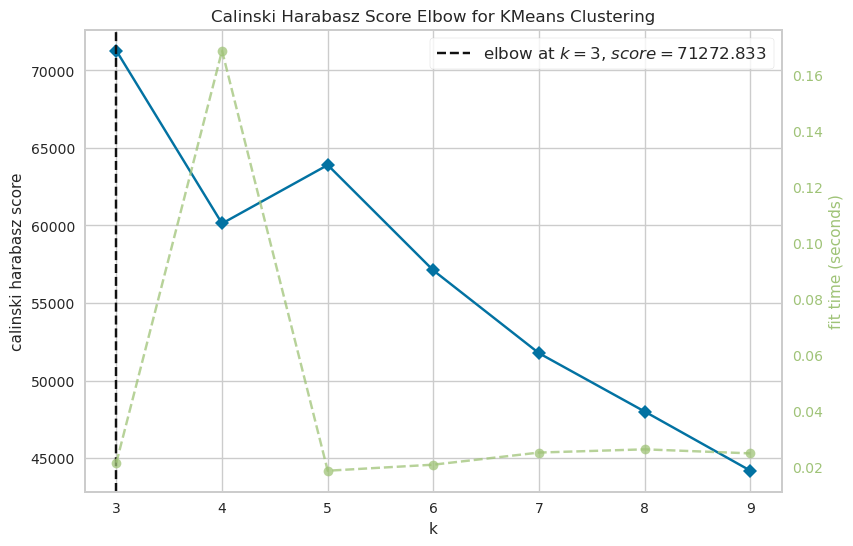

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [15]:
visualizer = KElbowVisualizer(model, k=(3,10), metric='calinski_harabasz')
visualizer.fit(X_minmax)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

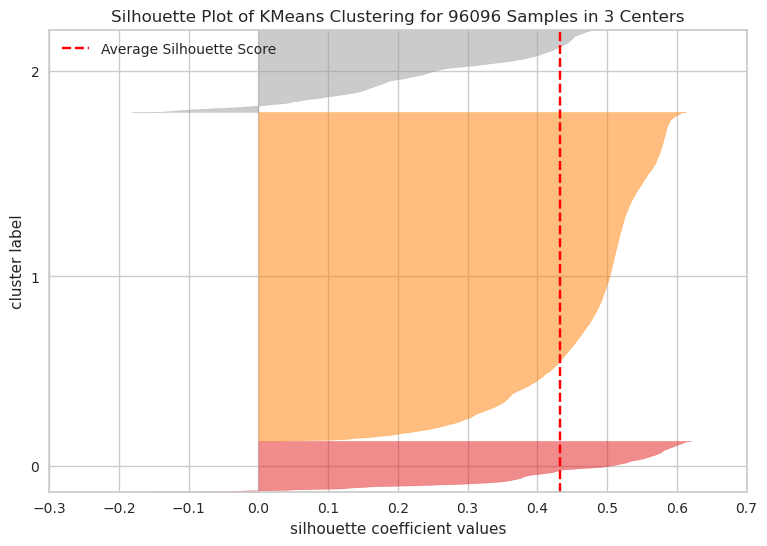

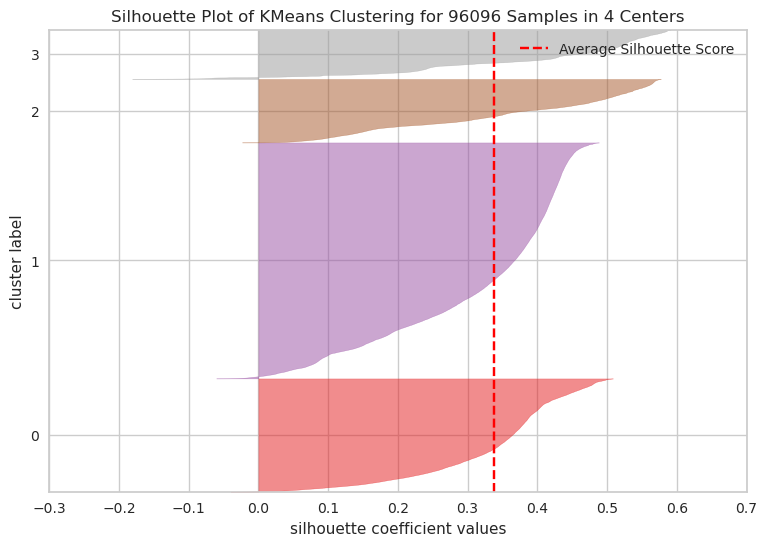

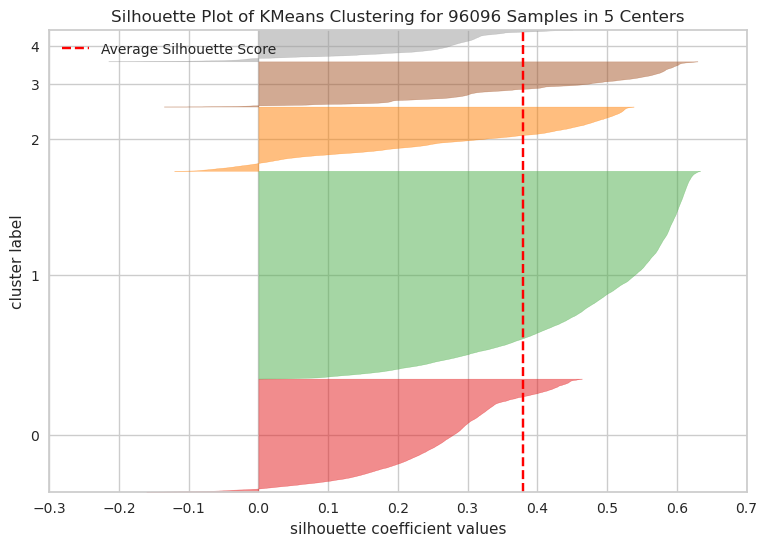

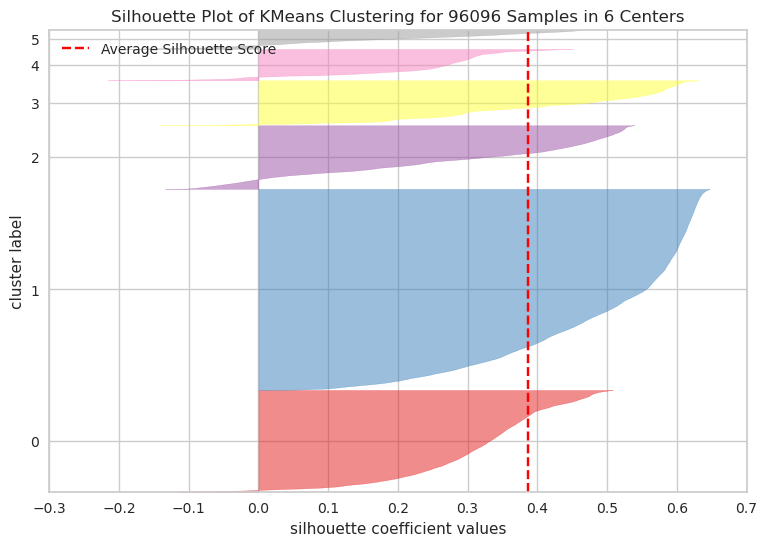

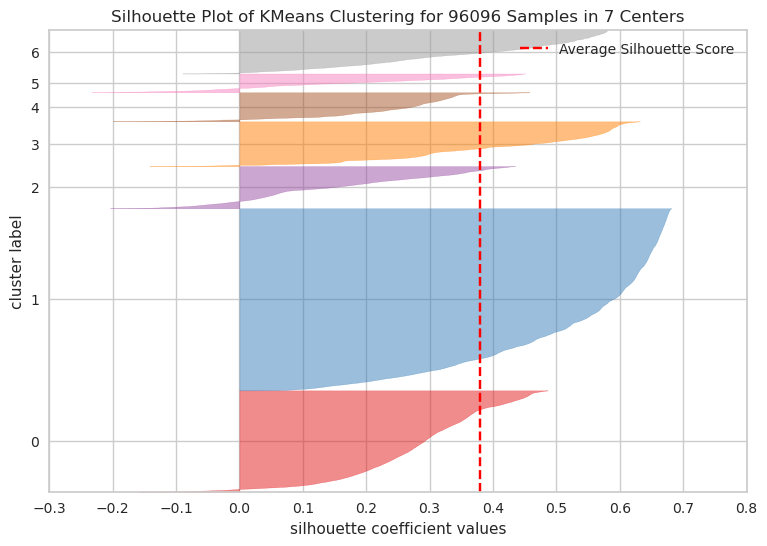

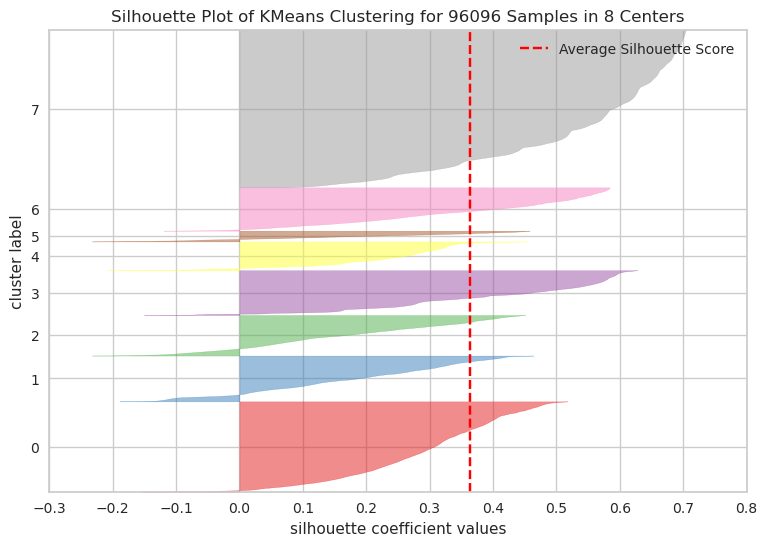

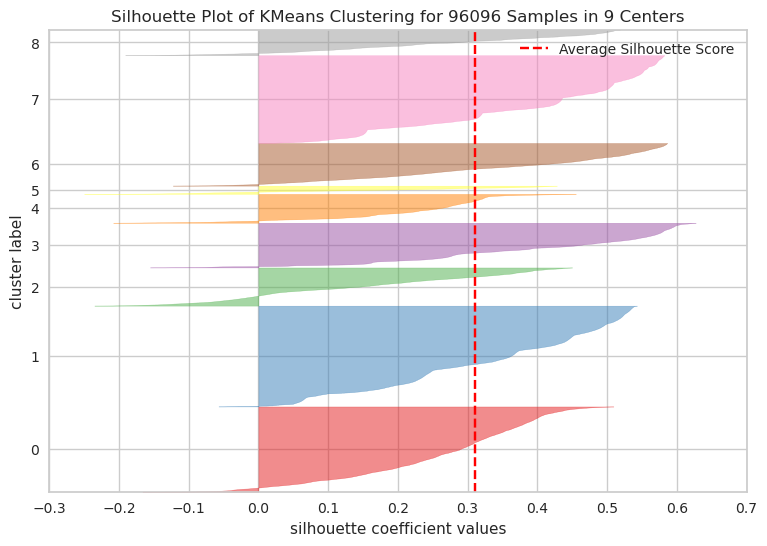

In [16]:
for k in range(3,10):
    model = KMeans(n_clusters=k, n_init=1, init='random', random_state=42)
    visualizer = SilhouetteVisualizer(model)
    visualizer.fit(X_minmax)    # Fit the data to the visualizer
    visualizer.poof()    # Draw/show/poof the data

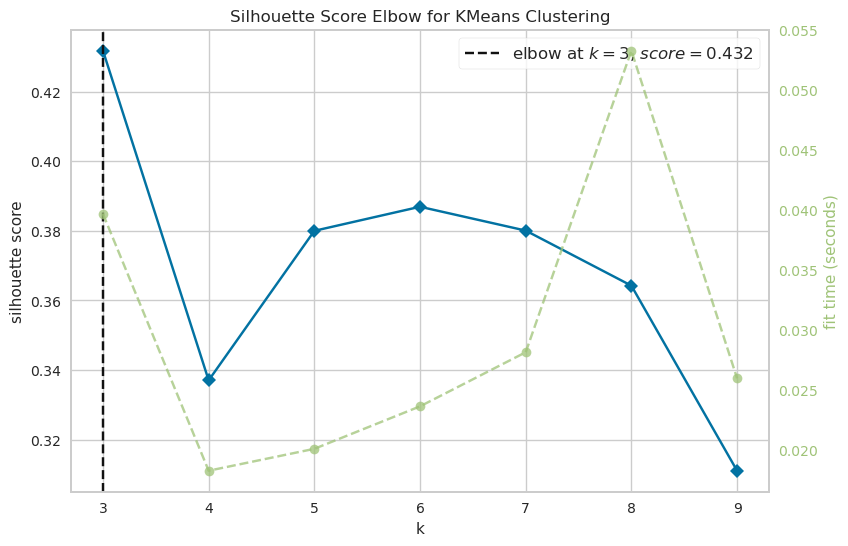

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [17]:
visualizer = KElbowVisualizer(model, k=(3,10), metric='silhouette')
visualizer.fit(X_minmax)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

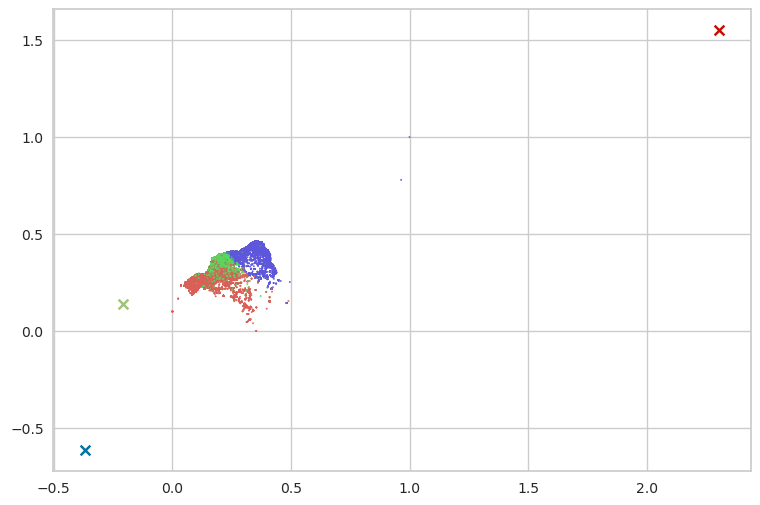

In [18]:
variableIn = X_norm
nbCluster = 3
model1 = KMeans(nbCluster, n_init=1, init='k-means++').fit(variableIn)
resultMod1 = model1.predict(variableIn)
colorGroup = sns.color_palette("hls", nbCluster)
colors = []
for groupe in resultMod1:
    colors.append(colorGroup[groupe])
plt.scatter(X_minmax[:,0], X_minmax[:,1], c=colors, s=1)
for center in model1.cluster_centers_:
    plt.scatter(center[0], center[1], marker='x')
plt.show()

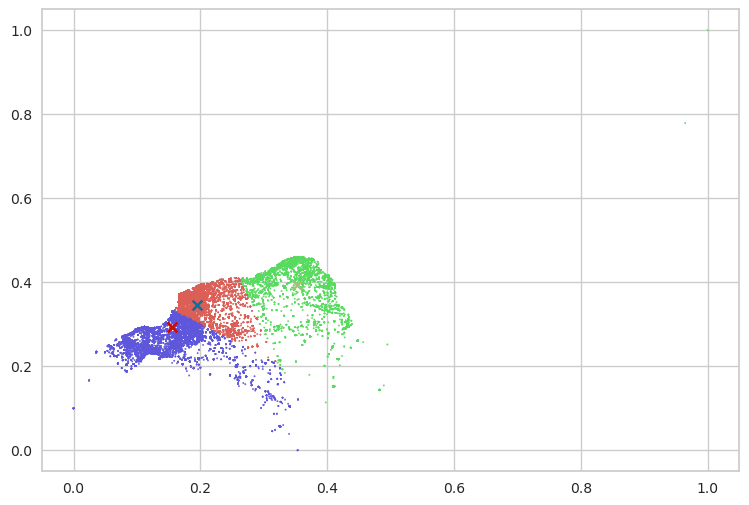

In [19]:
variableIn = X_minmax
nbCluster = 3
model1 = KMeans(nbCluster, n_init=1, init='k-means++').fit(variableIn)
resultMod1 = model1.predict(variableIn)
colorGroup = sns.color_palette("hls", nbCluster)
colors = []
for groupe in resultMod1:
    colors.append(colorGroup[groupe])
plt.scatter(X_minmax[:,0], X_minmax[:,1], c=colors, s=1)
for center in model1.cluster_centers_:
    plt.scatter(center[0], center[1], marker='x')
plt.show()

# Modelisation avec RFM

## Préprocessing des valeurs RFM

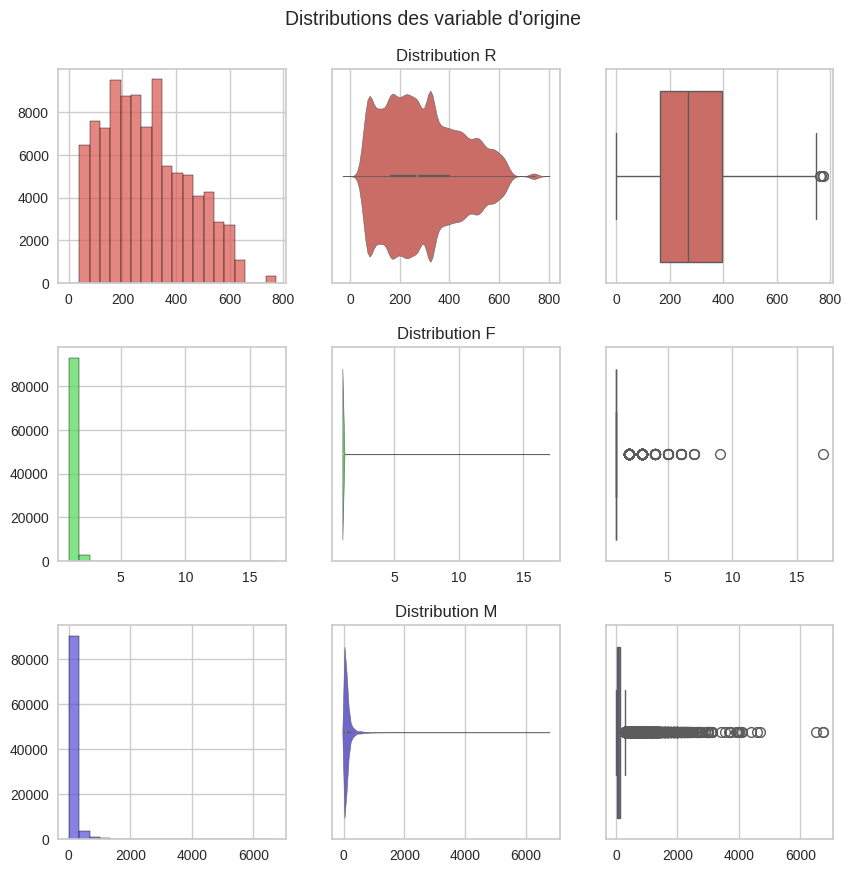

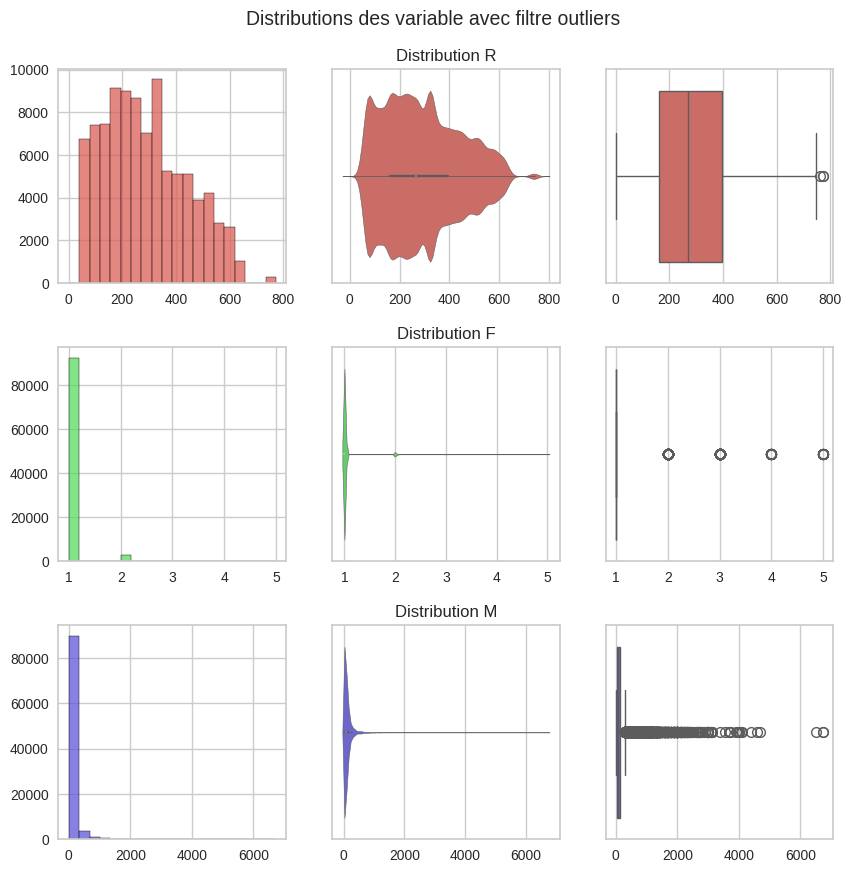

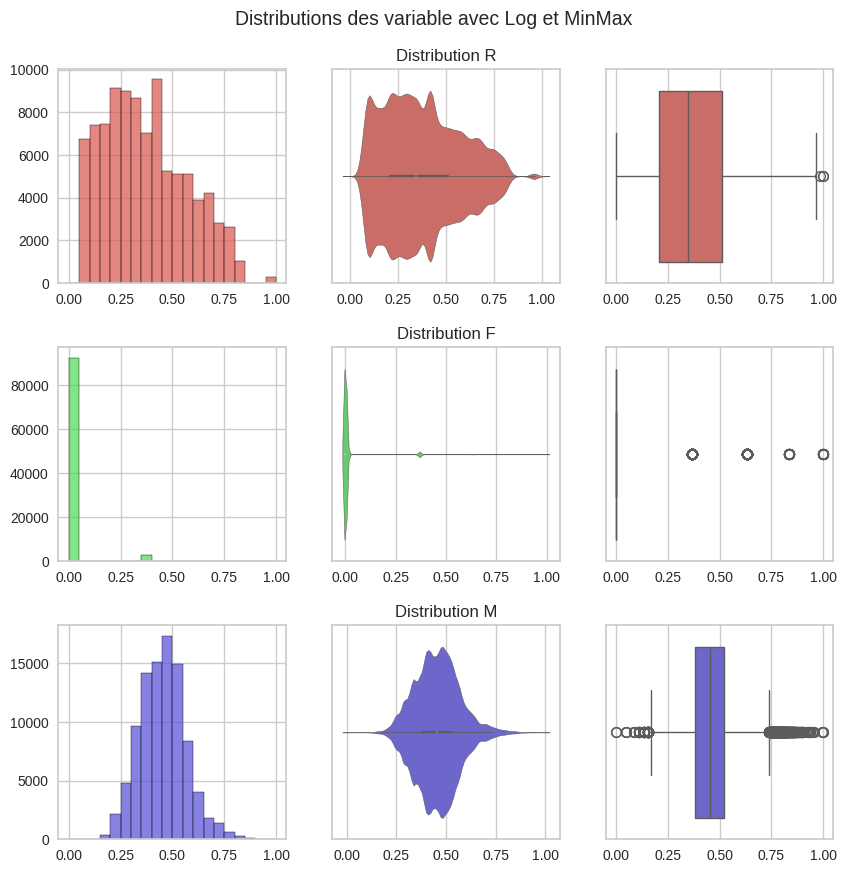

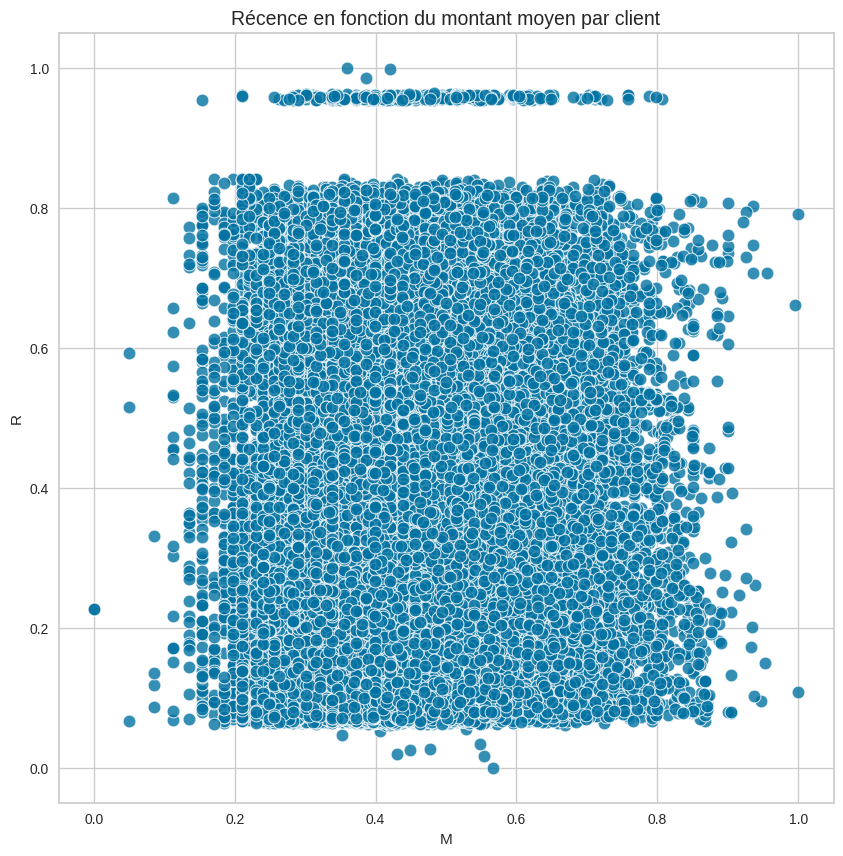

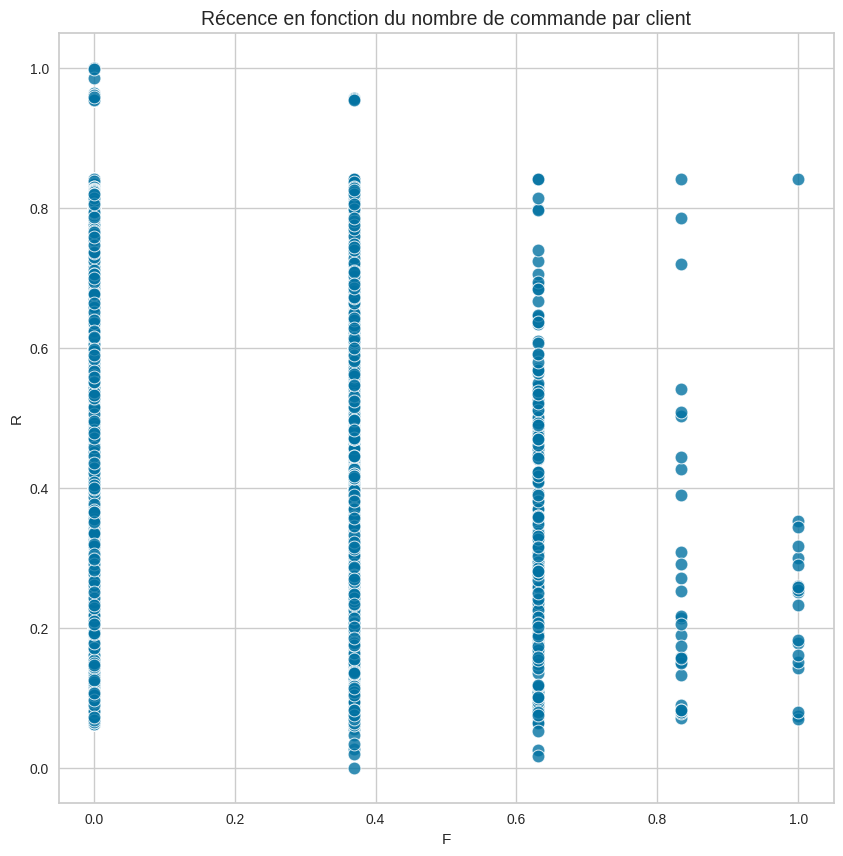

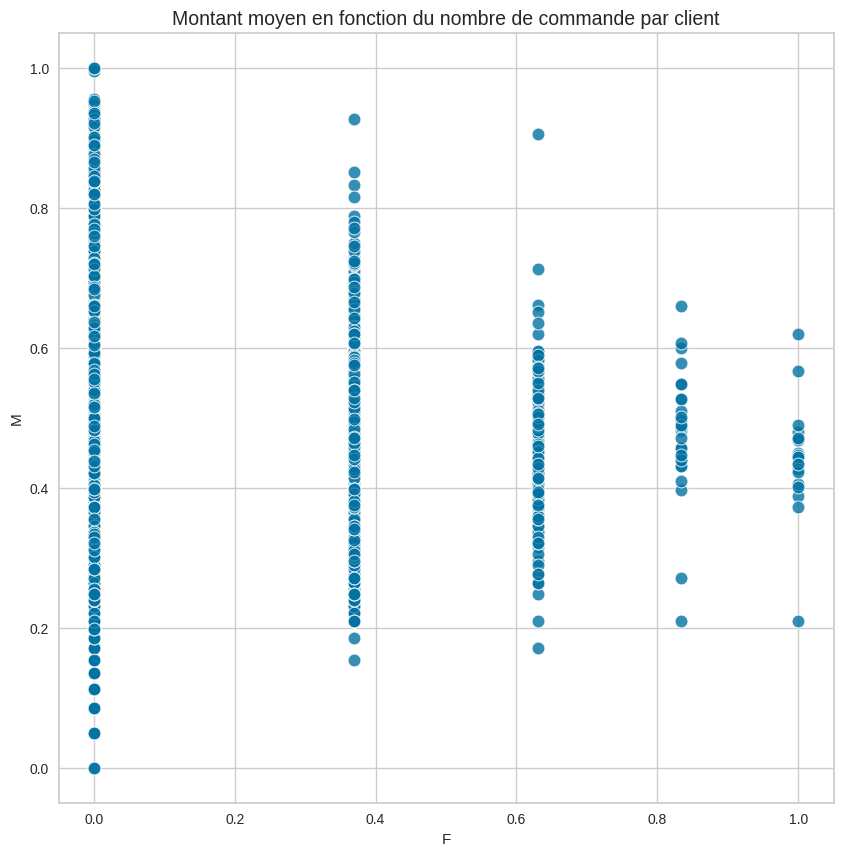

In [7]:

# récupération des variable d'origine
dfModele2 = pd.DataFrame(df[['R', 'F', 'M']])
analysDist(dfModele2, 'Distributions des variable d\'origine')

# on supprime les clients avec un montant moyen = 0
index2Del = dfModele2.loc[dfModele2['M']==0].index
dfModele2.drop(index2Del, inplace=True)
# on limite le nombre de commandes a 5
dfModele2.loc[dfModele2['F']>5,'F']=5
analysDist(dfModele2, 'Distributions des variable avec filtre outliers')

# application du log et du minMaxScaler
dfModele2['M'] = MinMaxScaler().fit_transform(np.log1p(dfModele2[['M']]))
dfModele2['F'] = MinMaxScaler().fit_transform(np.log1p(dfModele2[['F']]))
dfModele2['R'] = MinMaxScaler().fit_transform(dfModele2[['R']])
analysDist(dfModele2, 'Distributions des variable avec Log et MinMax')

plotData(dfModele2, 'M', 'R', colors=0,
         titre='Récence en fonction du montant moyen par client')
plotData(dfModele2, 'F', 'R', colors=0,
         titre='Récence en fonction du nombre de commande par client')
plotData(dfModele2, 'F', 'M', colors=0,
         titre='Montant moyen en fonction du nombre de commande par client')


## Modélisation du RFM avec Kmeans

In [8]:
variableIn = dfModele2
initialisation_modele = 'k-means++'
random_state = 42
n_init = 1

### Determination de la valeur de k

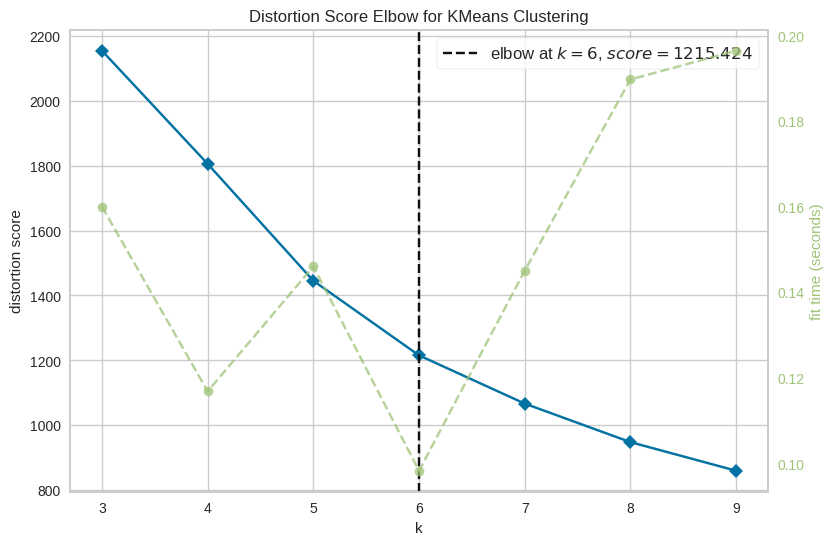

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [9]:
mpl.rcParams["figure.figsize"] = (9, 6)
# Instantiation du modele et de la visualisation
model2 = KMeans(n_init=n_init, init=initialisation_modele,
                random_state=random_state)
visualizer = KElbowVisualizer(model2, k=(3, 10))
visualizer.fit(variableIn)
visualizer.poof()    # affichage du graph

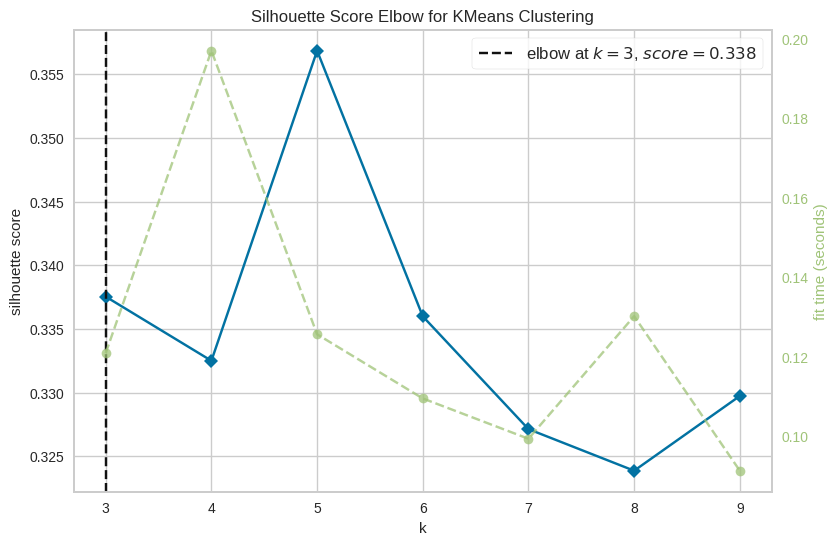

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [10]:
visualizer = KElbowVisualizer(model2, k=(3, 10), metric='silhouette')
visualizer.fit(variableIn)
visualizer.poof()    # affichage du graph

In [11]:
# d'après les graphiques précédents on choisi un nombre de 6 clusters
nbCluster=6

### Visualisation des silhouettes des clusters

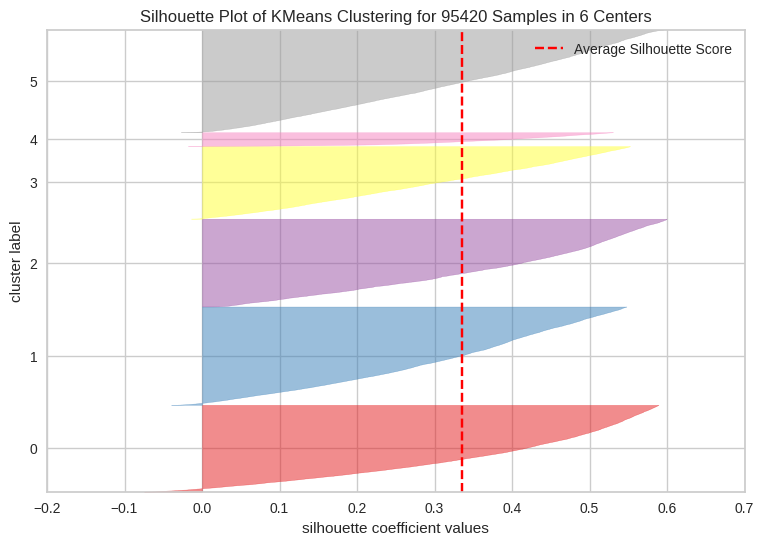

In [12]:
model2 = KMeans(n_clusters=nbCluster, n_init=n_init,
                init=initialisation_modele, random_state=random_state)
visualizer = SilhouetteVisualizer(model2)
visualizer.fit(variableIn)
bin = visualizer.poof()

> Nous pouvons observer sur ce graphe 5 clusters relativement homogènes en nombre d'individus avec peu d'erreurs de classification et un autre avec peu d'individus

### Modelisation

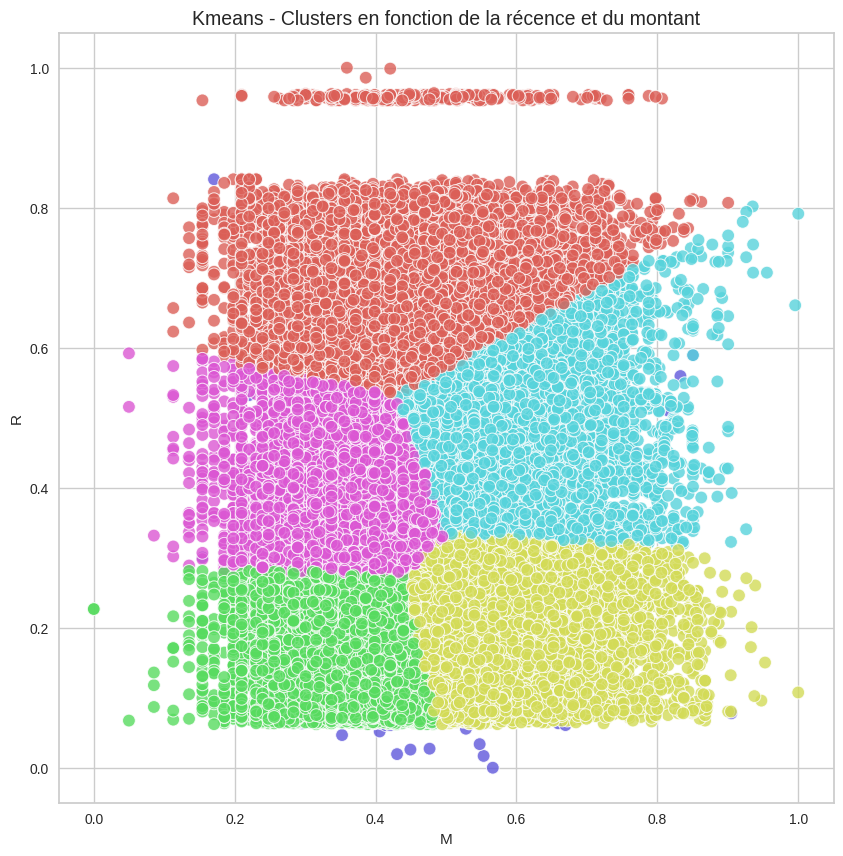

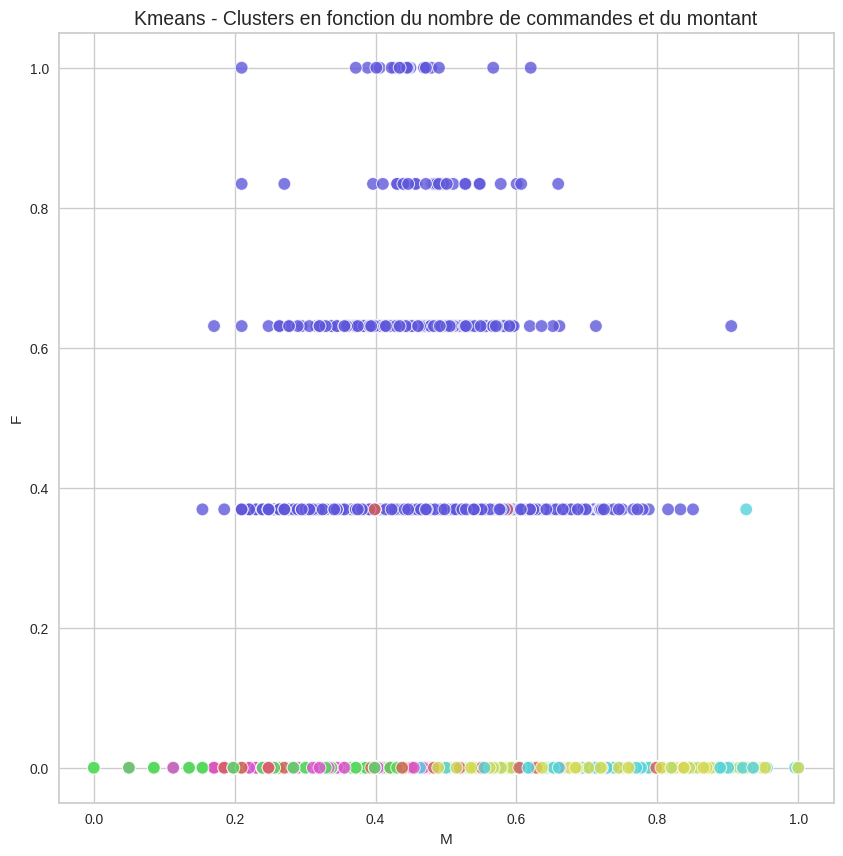

In [13]:
model2 = KMeans(nbCluster, n_init=n_init, init=initialisation_modele,
                random_state=random_state).fit(variableIn)
resultMod2 = model2.predict(variableIn)
colorGroup = sns.color_palette("hls", nbCluster)
colorsG = []
for groupe in resultMod2 :
    colorsG.append(colorGroup[groupe])

SortieModele2 = dfModele2.copy()
SortieModele2['Cluster'] = resultMod2
SortieModele2['Colors'] = colorsG

plotData(dfModele2, 'M', 'R', colors=colorsG, 
         titre='Kmeans - Clusters en fonction de la récence et du montant')
plotData(dfModele2, 'M', 'F', colors=colorsG,
         titre='Kmeans - Clusters en fonction du nombre de commandes et du montant')

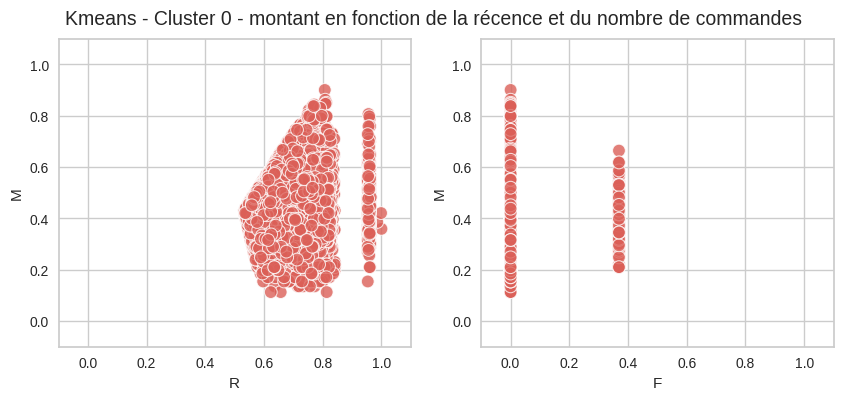

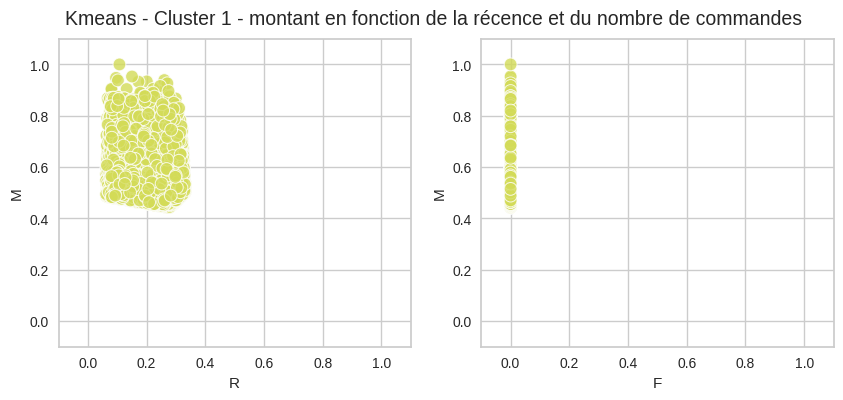

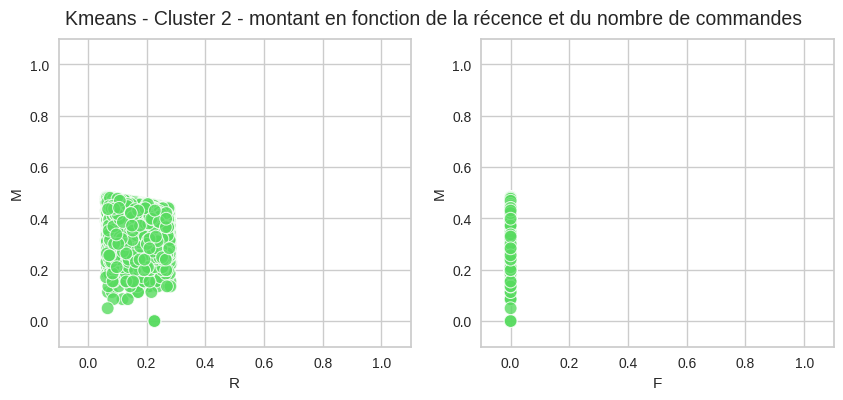

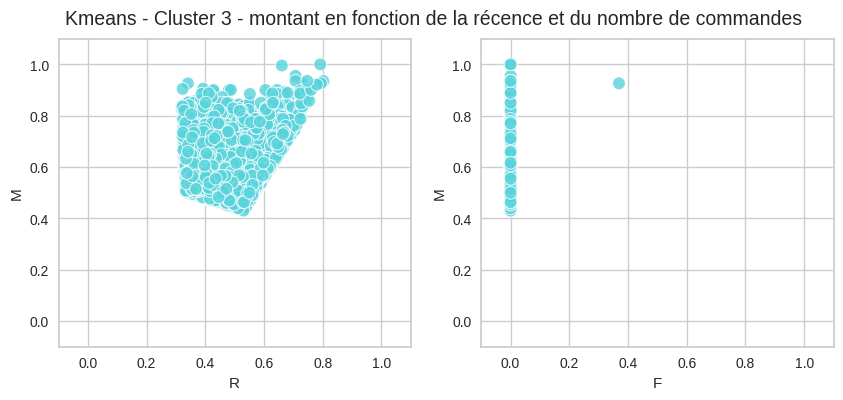

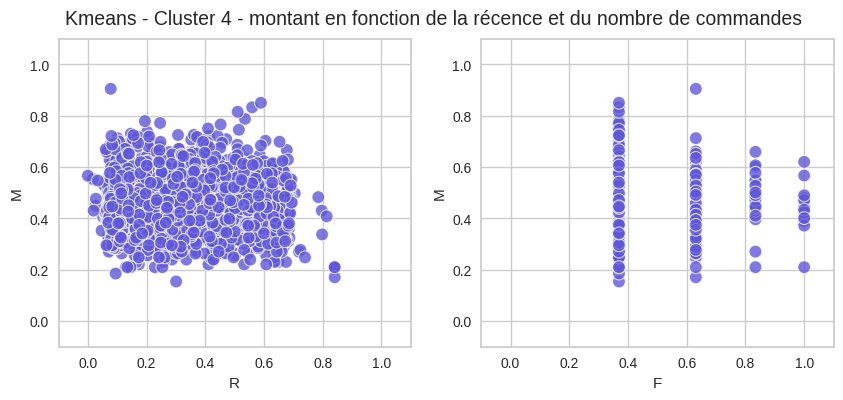

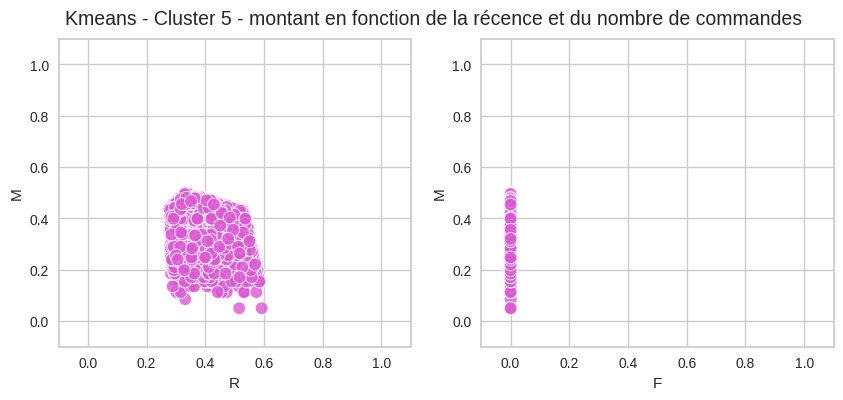

In [26]:

for cluster in (np.sort(SortieModele2['Cluster'].unique())):
    colorTemp = SortieModele2[
                    SortieModele2['Cluster'] == cluster]['Colors'].to_list()
    dfTemp = SortieModele2.loc[
                SortieModele2['Cluster'] == cluster,
                ['M', 'R', 'F']]
    plotDataComp(dfTemp,
                 graph1=['R','M'],
                 graph2= ['F', 'M'],
                 colors=colorTemp, 
                 titre=f'Kmeans - Cluster {cluster} - montant en fonction de la récence et du nombre de commandes')


> Nous pouvons identifier les clusters de clients :<br>
> <b>Cluster O</b> : Ceux n'ayant <u>pas commandé depuis longtemps</u> et avec peu de quantité de commande<br>
> <b>Cluster 1</b> : Commandes <u>uniques récentes</u> avec <u>montants importants</u><br>
> <b>Cluster 2</b> : Commandes <u>uniques récentes</u> avec <u>petits montants</u><br>
> <b>Cluster 3</b> : Commandes <u>uniques plus anciennes</u> avec <u>montants importants</u><br>
> <b>Cluster 4</b> : Le personnes qui ont <u>acheté plusieurs fois</u> sans notion de montant ni de récence<br>
> <b>Cluster 5</b> : Commandes <u>uniques plus anciennes</u> avec <u>petits montants</u><br>
> 

### Visualisation 3d des clusters

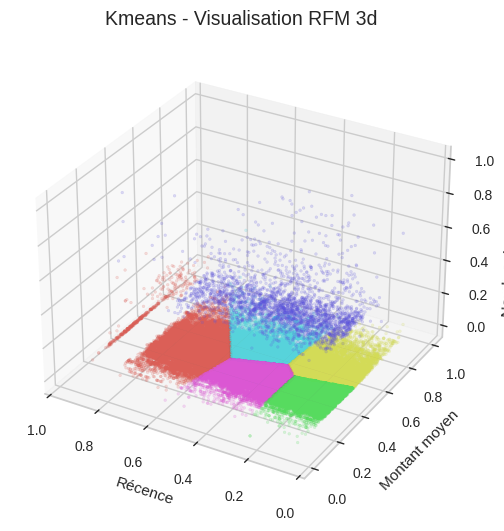

In [15]:
titre="Kmeans - Visualisation RFM 3d"
f=plt.figure(figsize = (6,6))
f.set_figwidth=20
f.set_figheight=20
ax=f.add_subplot(projection='3d')
x=dfModele2['R']
y=dfModele2['M']
z=dfModele2['F']

plt.title(titre, fontsize=14, pad=15)
ax.set_xlim(1,0)
scoreE=ax.scatter(x, y, z, color=colorsG, s=4, alpha=0.2)
ax.set_xlabel('Récence')
ax.set_ylabel('Montant moyen')
ax.set_zlabel('Nombre de commandes')
ax.xaxis.labelpad=8
ax.yaxis.labelpad=8
ax.zaxis.labelpad=8
ax.set_facecolor('white')
plt.savefig(dossierImage+titre+'.jpg')
plt.show()

### Répartition des variables par cluster

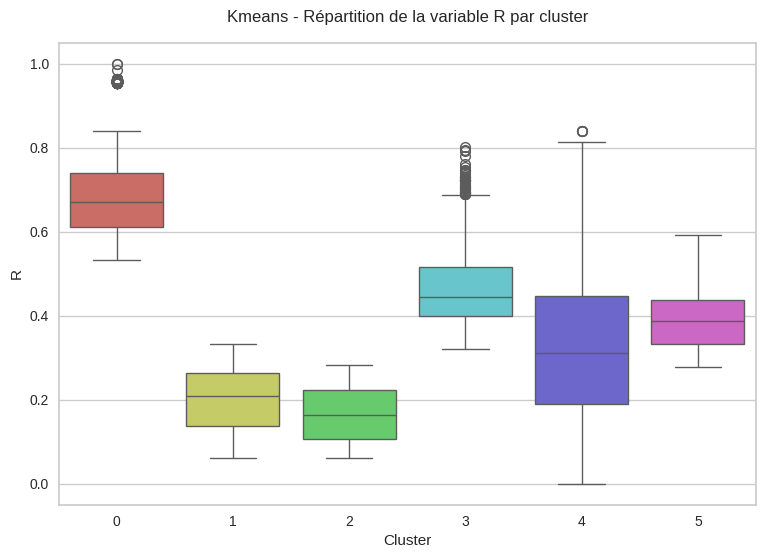

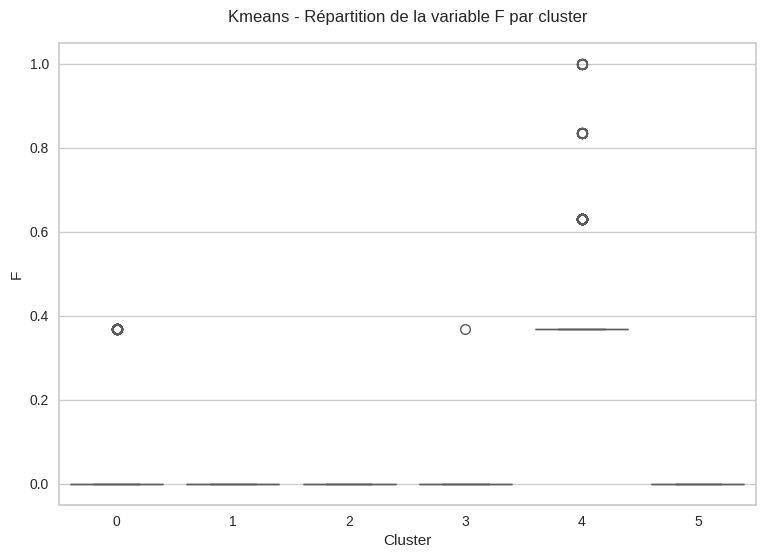

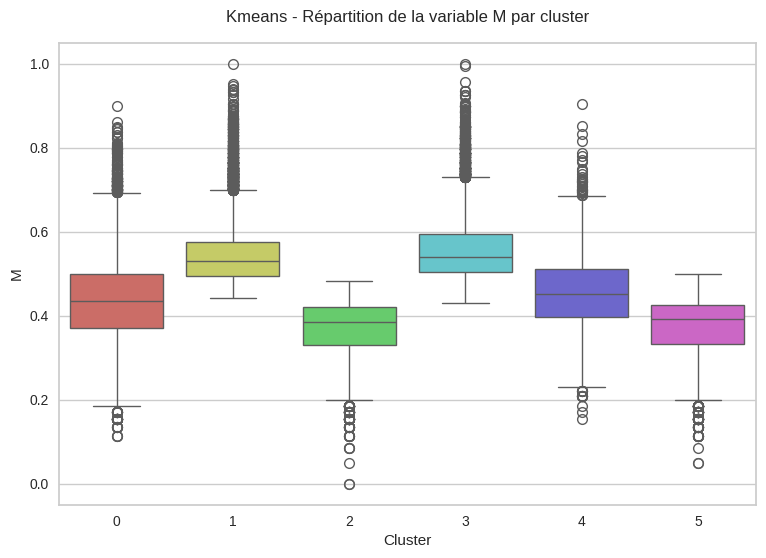

In [16]:
for variable in SortieModele2.columns:
    if (variable != 'Cluster') & (variable != 'Colors'):
        titre = f'Kmeans - Répartition de la variable {variable} par cluster'
        sns.boxplot(y=variable,
                    x='Cluster',
                    data=SortieModele2,
                    palette=colorGroup)
        plt.title(titre, pad=15)
        plt.suptitle('')
        plt.savefig(dossierImage+titre+'.jpg')
        plt.show()

### Répartition des individus par cluster

In [17]:
for cluster in (np.sort(SortieModele2['Cluster'].unique())):
    individus = SortieModele2.loc[
                        SortieModele2['Cluster']==cluster,'Cluster'].count()
    print(f'Cluster {cluster} --> {individus} individus')

Cluster 0 --> 17945 individus
Cluster 1 --> 20315 individus
Cluster 2 --> 18141 individus
Cluster 3 --> 14992 individus
Cluster 4 --> 2860 individus
Cluster 5 --> 21167 individus


### Répartition des variables dans les clusters

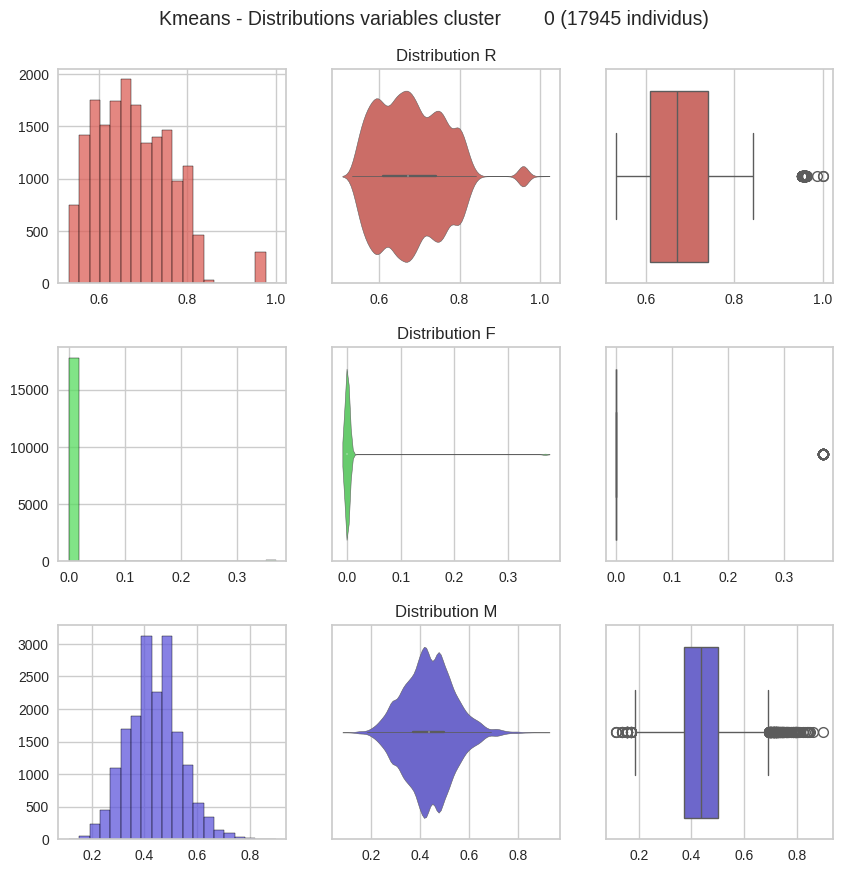

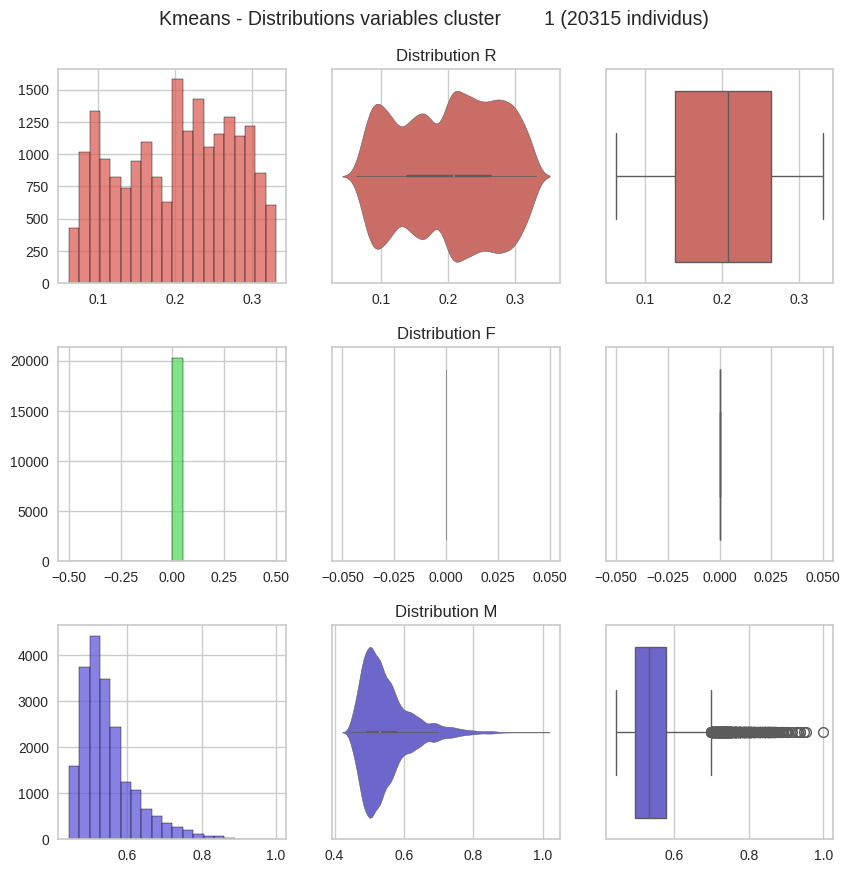

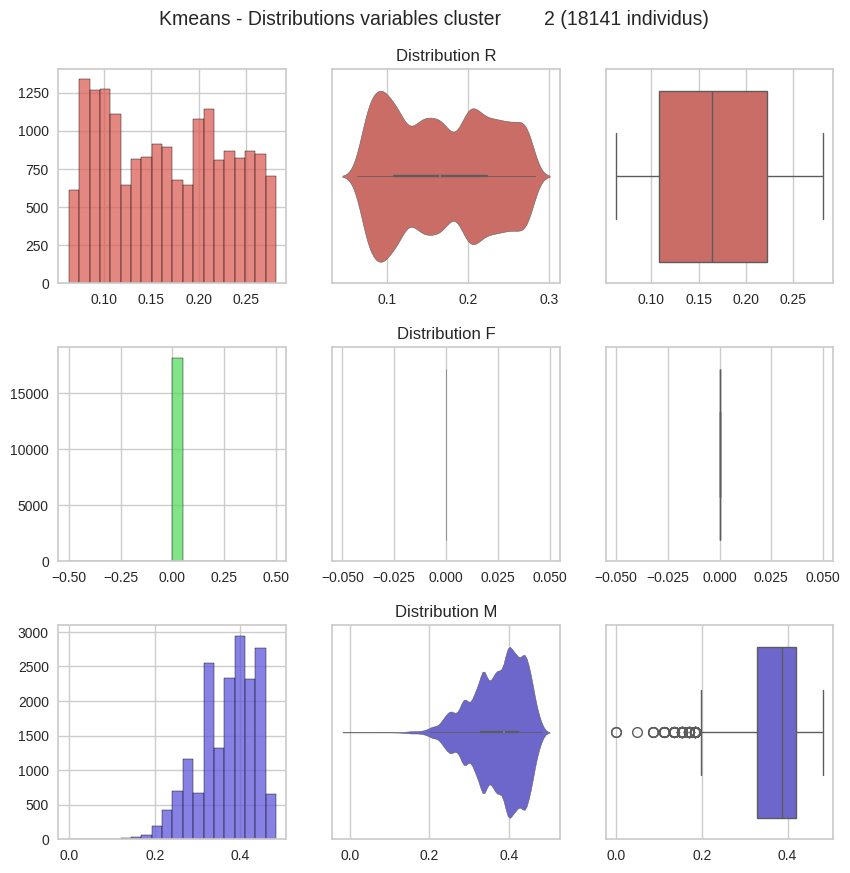

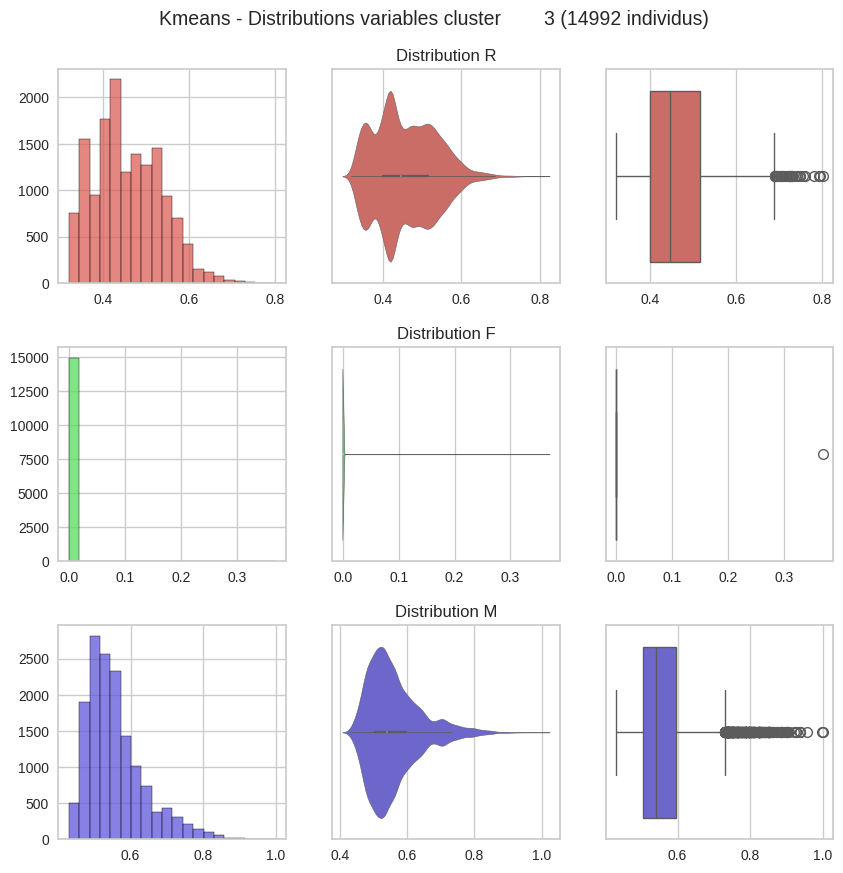

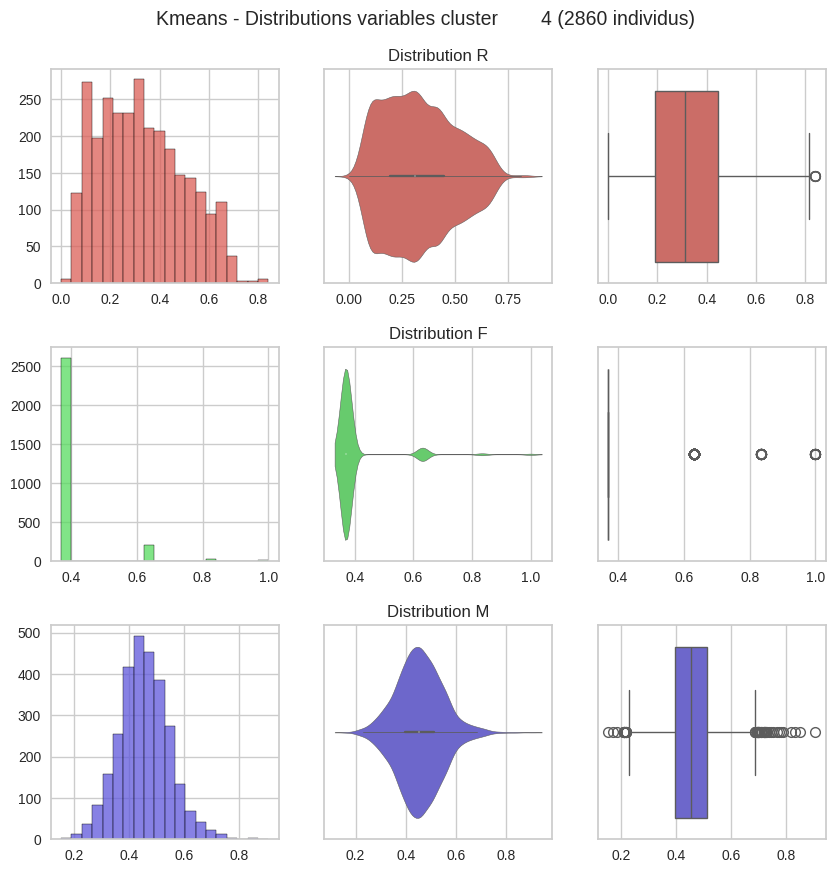

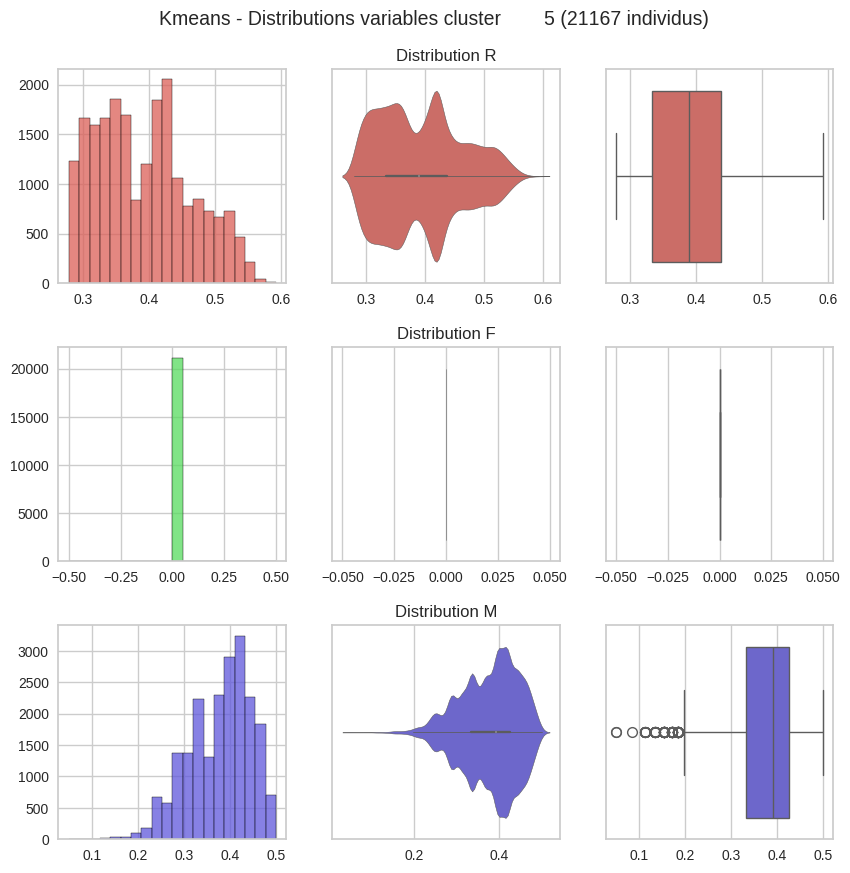

In [18]:
for cluster in (np.sort(SortieModele2['Cluster'].unique())):
    individus = SortieModele2.loc[
                    SortieModele2['Cluster'] == cluster, 'Cluster'].count()
    analysDist(
        SortieModele2\
            .loc[SortieModele2['Cluster'] == cluster]\
            .drop(['Cluster', 'Colors'], axis=1),
        f'Kmeans - Distributions variables cluster\
        {cluster} ({individus} individus)')

## Modélisation du RFM avec DbScan

In [19]:
from sklearn.cluster import DBSCAN
from sklearn import metrics




### Modélisation

In [20]:
modeleDbs1 = DBSCAN(eps=0.05, min_samples=5).fit(variableIn)
labelsDbs1 = modeleDbs1.labels_
# Comptage des clusters
n_clusters_ = len(set(labelsDbs1)) - (1 if -1 in labelsDbs1 else 0)
n_noise_ = list(labelsDbs1).count(-1)
print("Nombre de clusters estimé: %d" % n_clusters_)
print("Nombre de points de bruit estimé: %d" % n_noise_)

Nombre de clusters estimé: 7
Nombre de points de bruit estimé: 96


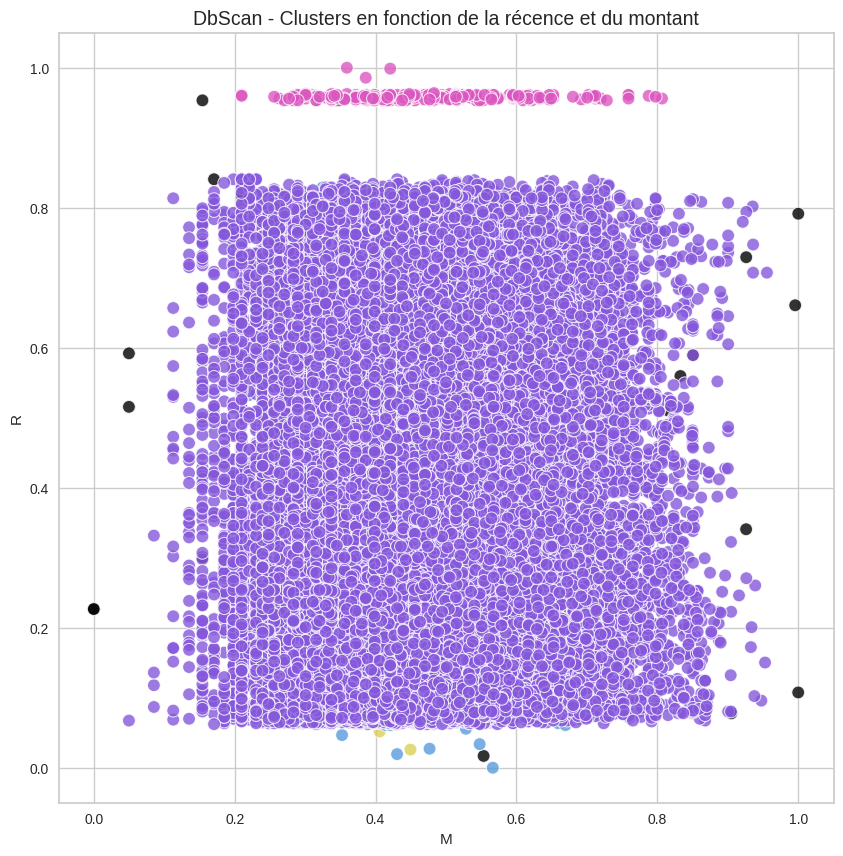

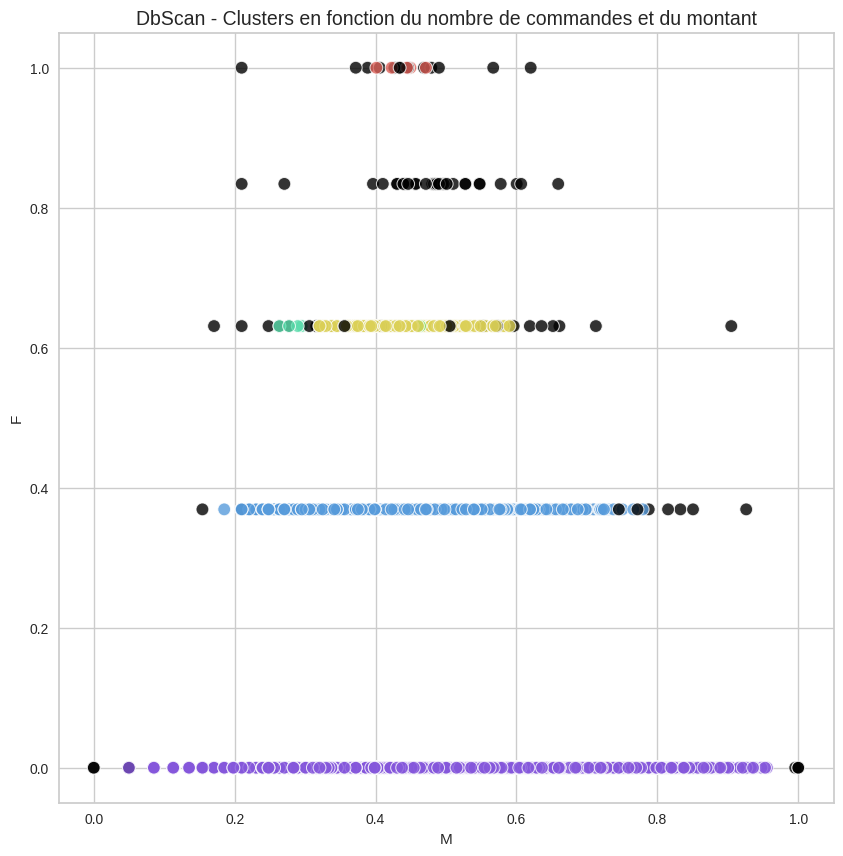

In [21]:
resultDbs1 = modeleDbs1.labels_
colorGroup = sns.color_palette("hls", n_clusters_)
colorsG = []
for groupe in resultDbs1 :
    if groupe == -1:
        colorsG.append((0, 0, 0))
    else:
        colorsG.append(colorGroup[groupe])

SortieModeleDbs1 = dfModele2.copy()
SortieModeleDbs1['Cluster'] = resultDbs1
SortieModeleDbs1['Colors'] = colorsG

plotData(dfModele2,
         'M',
         'R',
         colors=colorsG,
         titre='DbScan - Clusters en fonction de la récence et du montant')
plotData(dfModele2,
         'M',
         'F',
         colors=colorsG,
         titre='DbScan - Clusters en fonction du nombre de commandes et du montant')

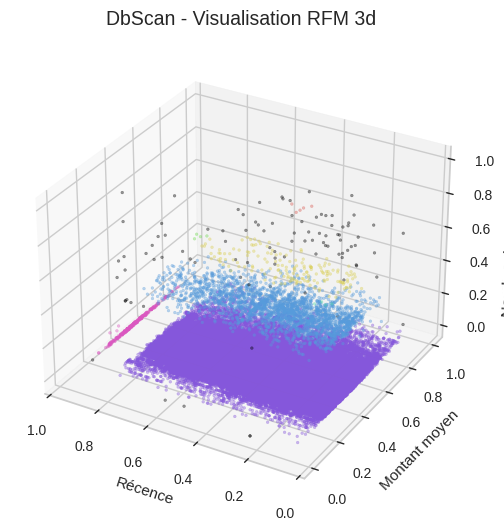

In [22]:
titre = "DbScan - Visualisation RFM 3d"
f = plt.figure(figsize = (6,6))
f.set_figwidth=20
f.set_figheight=20
ax = f.add_subplot(projection='3d')
x = dfModele2['R']
y = dfModele2['M']
z = dfModele2['F']

plt.title(titre, fontsize=14, pad=15)
ax.set_xlim(1,0)
scoreE = ax.scatter(x, y, z, color=colorsG, s=4, alpha=0.4)
ax.set_xlabel('Récence')
ax.set_ylabel('Montant moyen')
ax.set_zlabel('Nombre de commandes')
ax.xaxis.labelpad=8
ax.yaxis.labelpad=8
ax.zaxis.labelpad=8
ax.set_facecolor('white')
plt.savefig(dossierImage+titre+'.jpg')
plt.show()

> Nous pouvons observer une classification en strates sur ce modèle

### Répartition des individus par cluster

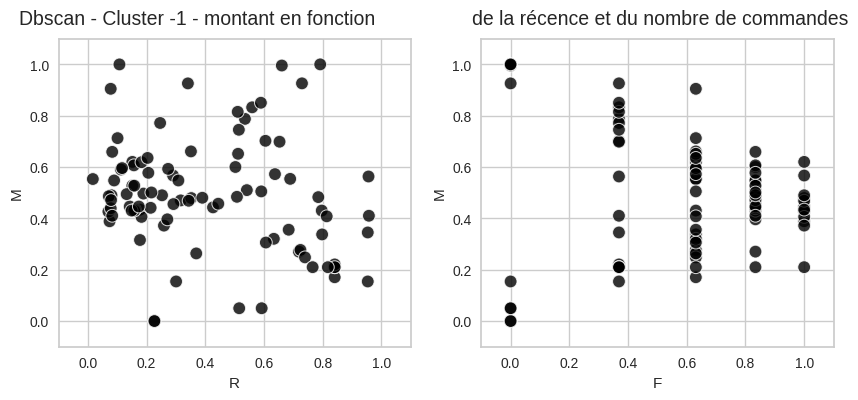

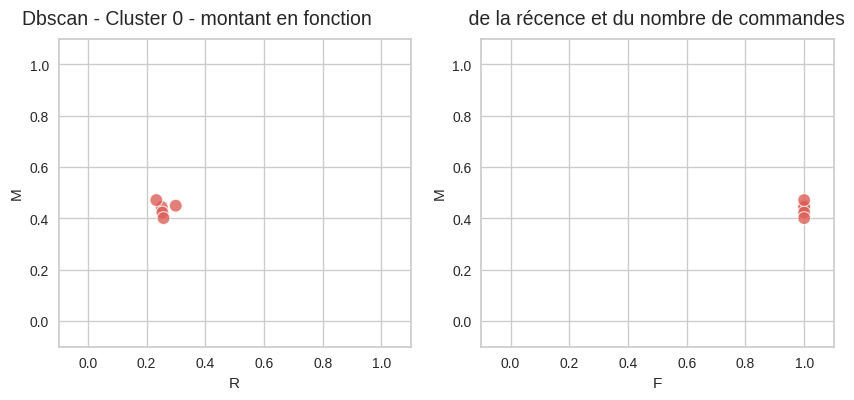

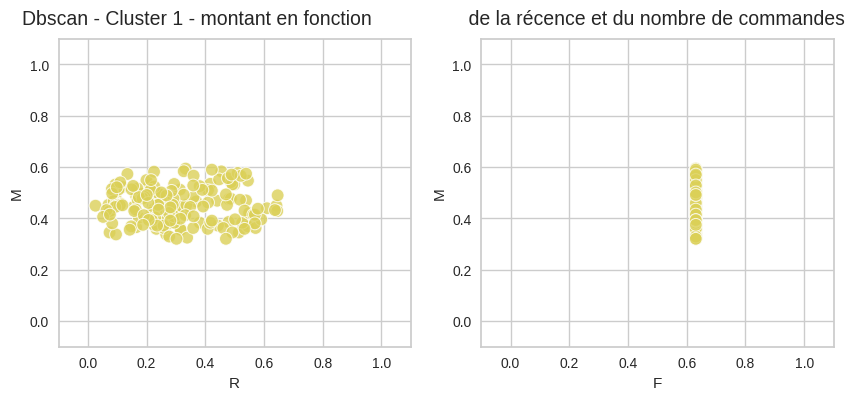

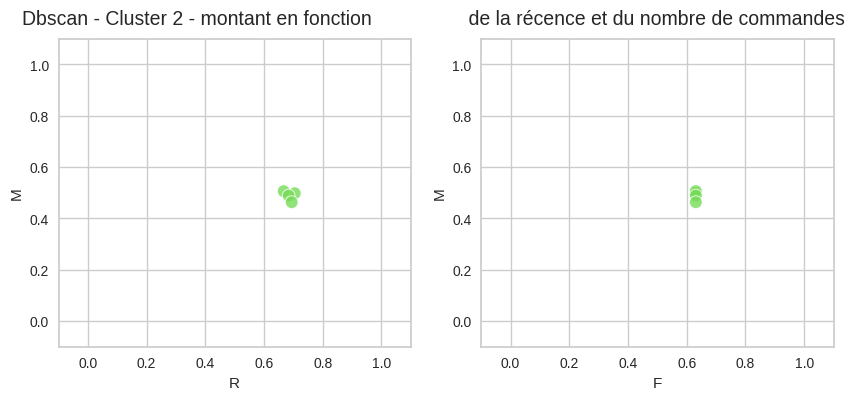

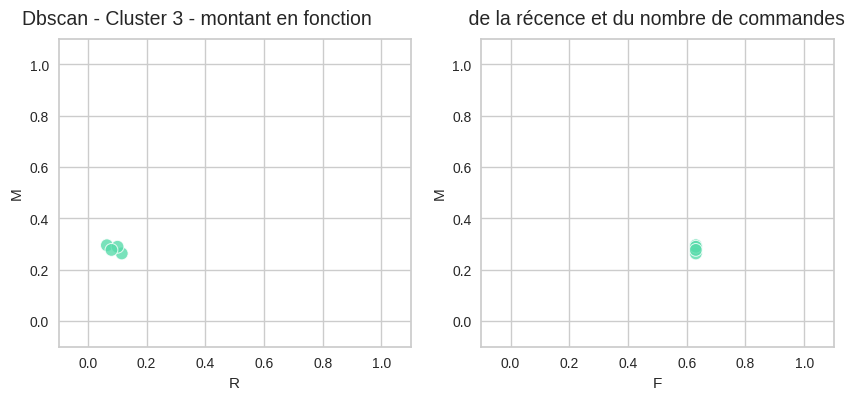

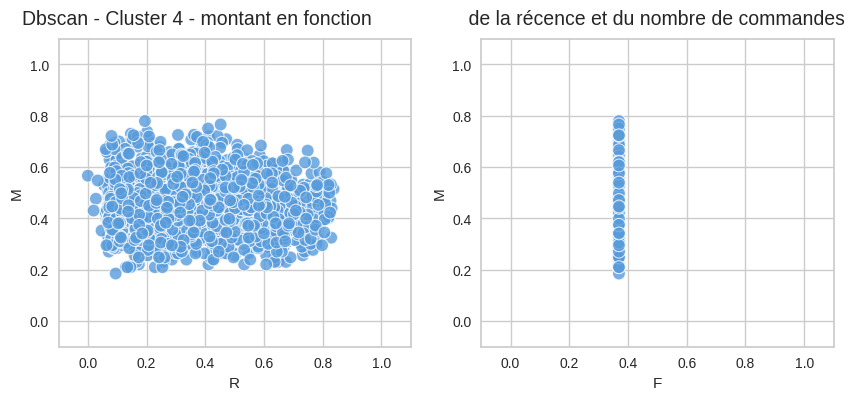

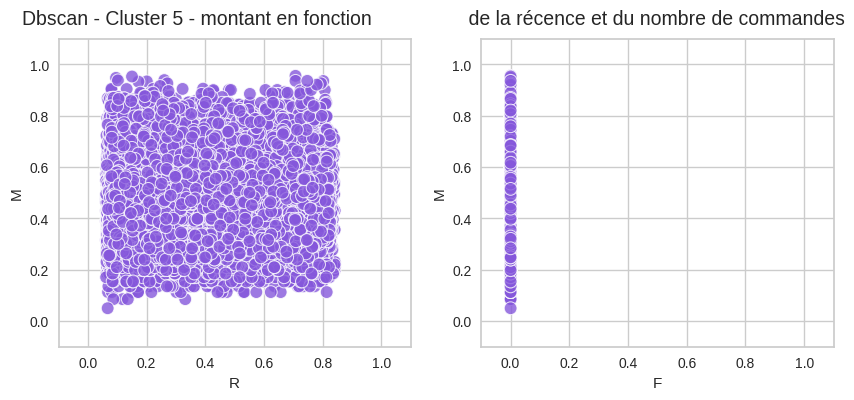

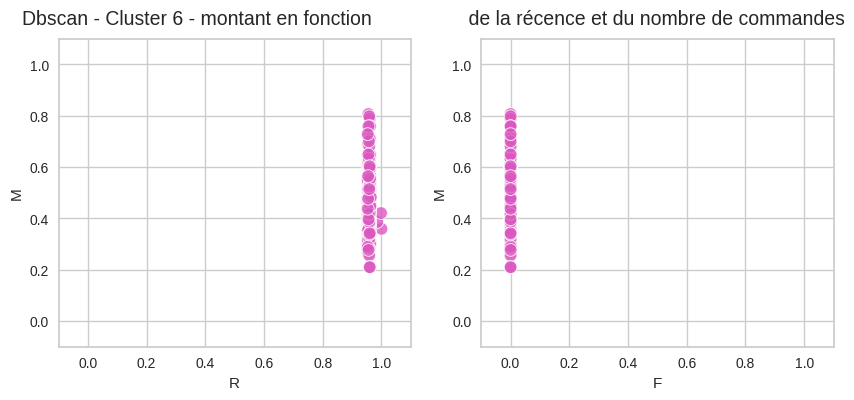

In [24]:

for cluster in (np.sort(SortieModeleDbs1['Cluster'].unique())):
    colorTemp = SortieModeleDbs1[
                  SortieModeleDbs1['Cluster'] == cluster]['Colors'].to_list()
    dfTemp = SortieModeleDbs1.loc[
                  SortieModeleDbs1['Cluster'] == cluster,
                  ['M','R','F']]
    plotDataComp(dfTemp,
                 graph1=['R','M'],
                 graph2=['F','M'],
                 colors=colorTemp,
                 titre=f'Dbscan - Cluster {cluster} - montant en fonction \
                 de la récence et du nombre de commandes')


> Nous pouvons identifier les clusters de clients :<br>
> <b>Cluster -1</b> : Ceux que l'algorithme n'a pas pu classifier, considérés comme du <u>bruit</u><br>
> <b>Cluster O</b> : Clients avec <u>5 commandes ou plus</u> sans notion de montant ni de récence<br>
> <b>Cluster 1</b> : <u>3 commandes récentes</u> avec <u>montants moyens</u><br>
> <b>Cluster 2</b> : <u>3 commandes anciennes</u> avec <u>montants moyens</u><br>
> <b>Cluster 3</b> : <u>3 commandes récentes</u> avec <u>petits montants</u><br>
> <b>Cluster 4</b> : Le personnes qui ont passé <u>deux commandes</u> sans notion de montant ni de récence<br>
> <b>Cluster 5</b> : Le personnes qui ont passé une <u>commande unique</u> sans notion de montant ni de récence<br>
> <b>Cluster 6</b> : Ceux n'ayant <u>pas commandé depuis longtemps</u> et avec peu de quantité de commande

In [25]:
for cluster in (np.sort(SortieModeleDbs1['Cluster'].unique())):
    individus = SortieModeleDbs1.loc[
                    SortieModeleDbs1['Cluster'] == cluster,'Cluster'].count()
    print(f'Cluster {cluster} --> {individus} individus')

Cluster -1 --> 96 individus
Cluster 0 --> 5 individus
Cluster 1 --> 169 individus
Cluster 2 --> 4 individus
Cluster 3 --> 4 individus
Cluster 4 --> 2720 individus
Cluster 5 --> 92127 individus
Cluster 6 --> 295 individus


## Choix de la modélisation

Le K-means semble la meilleure option sachant qu'il est capable de segmenter les clients ayants réalisés qu'une seule commande

### augmentation du nombre de features 

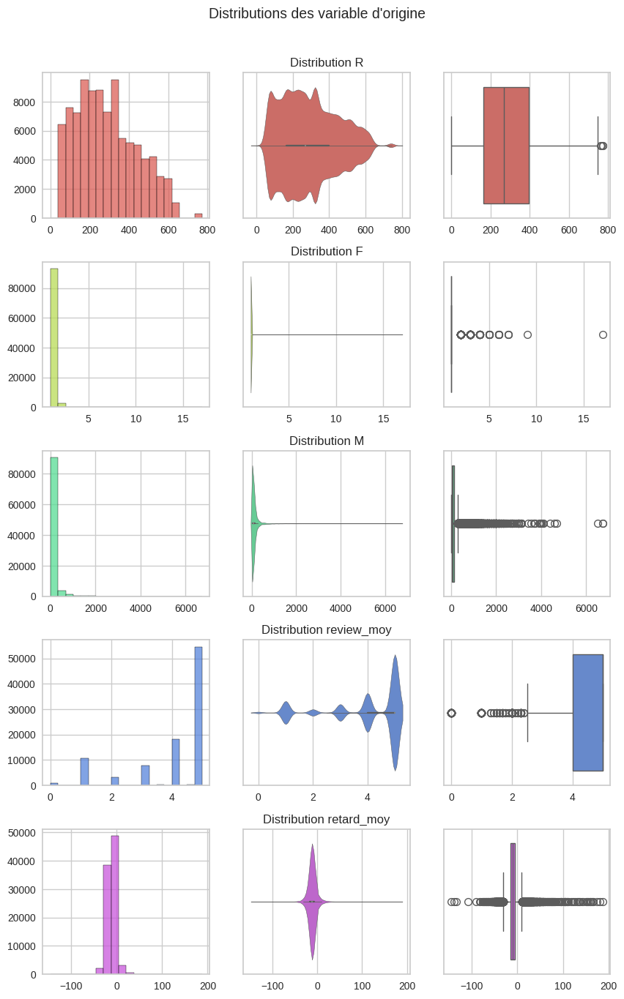

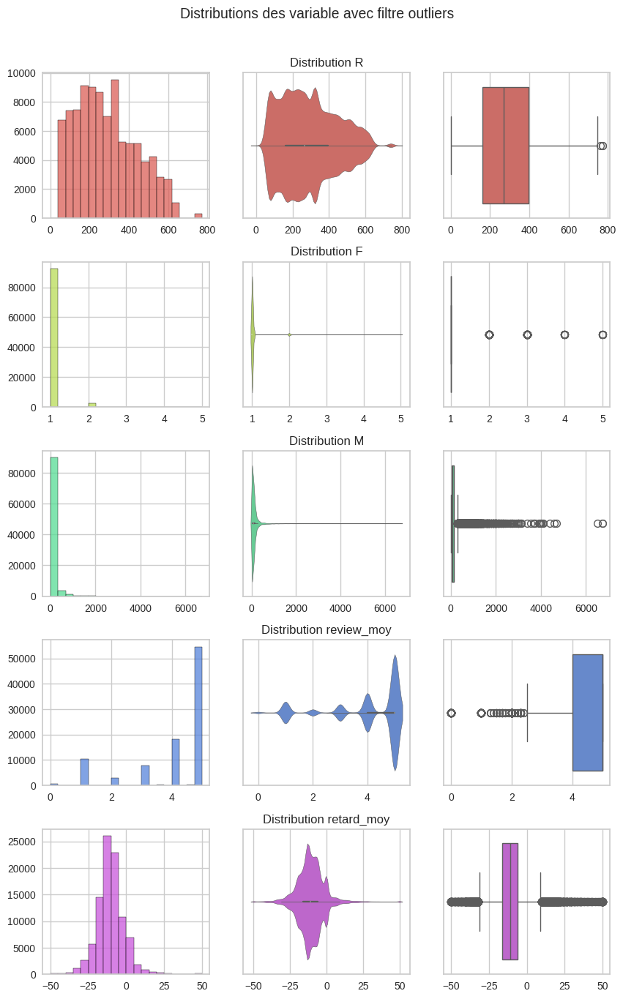

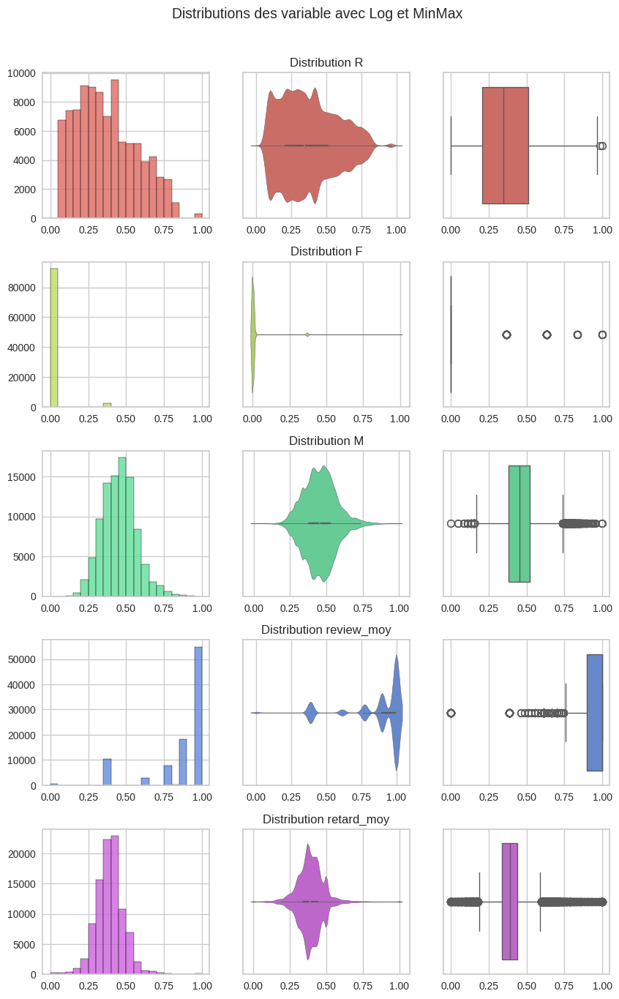

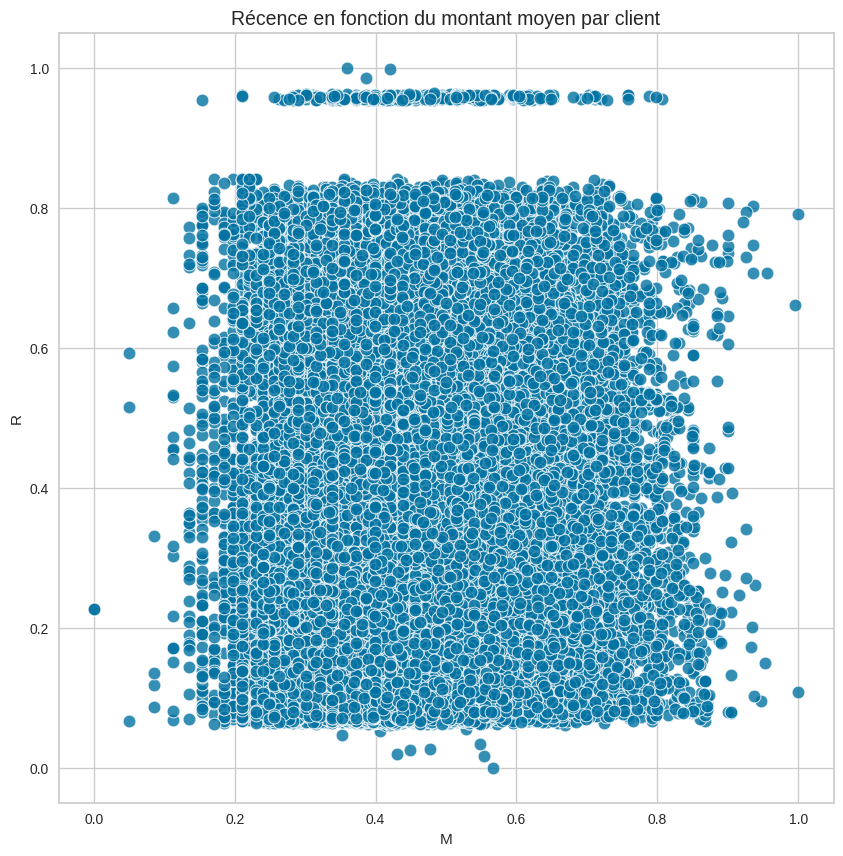

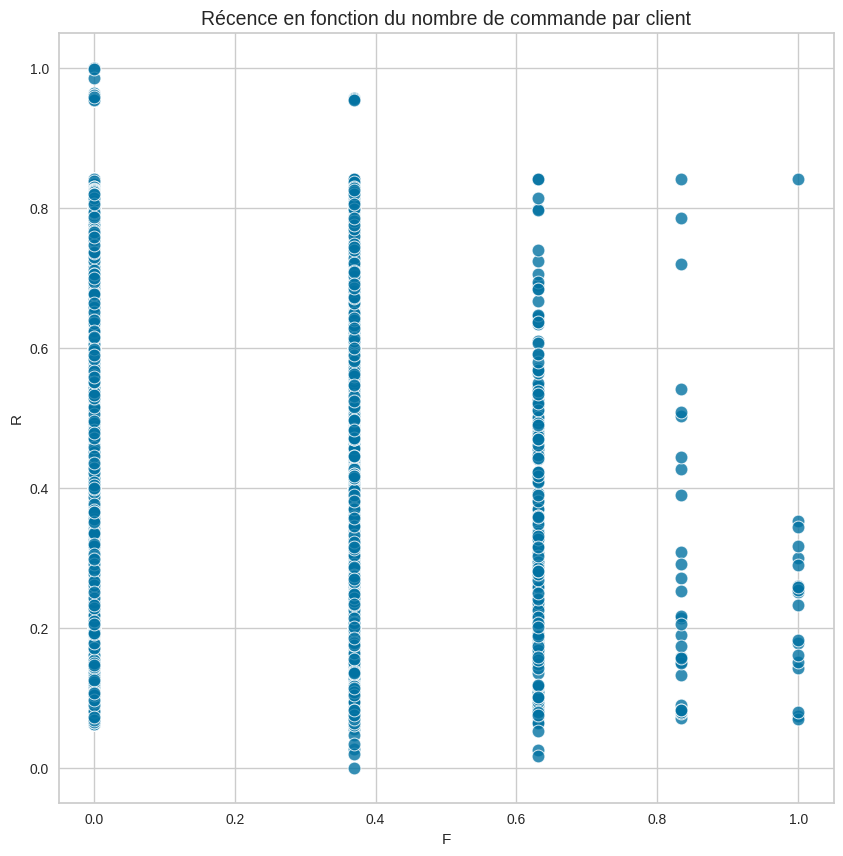

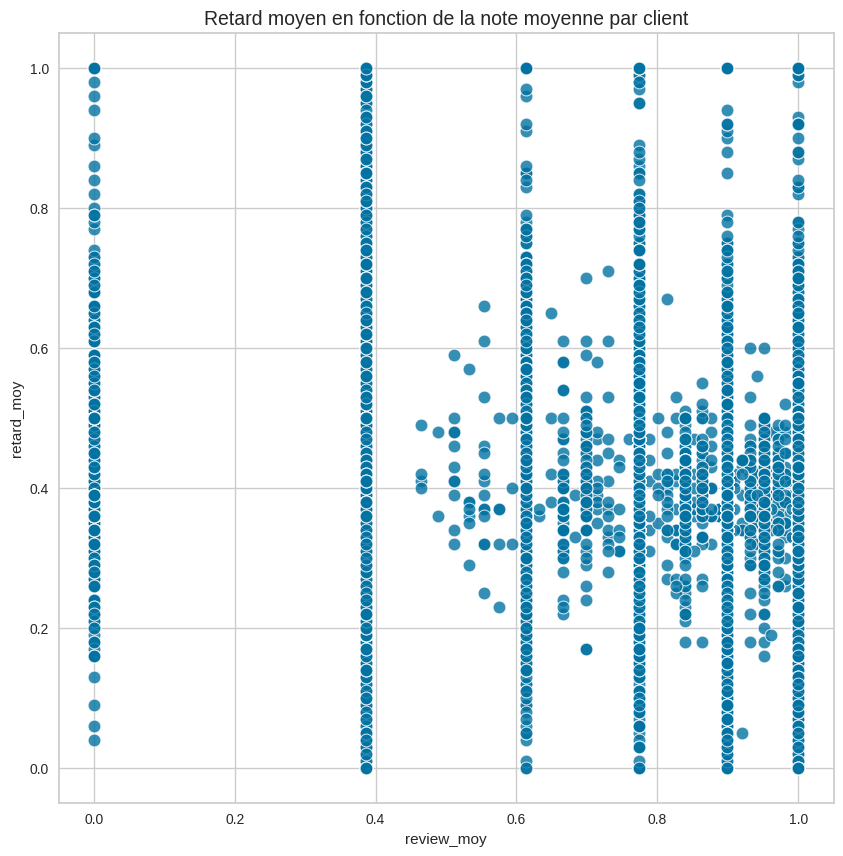

In [27]:
# récupération des variable d'origine
dfModele3 = pd.DataFrame(df[['R', 'F', 'M',
                             'review_moy','retard_moy']])
#dfModele3=pd.DataFrame(df[['R', 'nb_order', 'montant_moy','review_moy']])
analysDist(dfModele3, 'Distributions des variable d\'origine')

# on supprime les clients avec un montant moyen = 0
index2Del = dfModele3.loc[dfModele3['M'] == 0].index
dfModele3.drop(index2Del, inplace=True)
# on limite le nombre de commandes a 5
dfModele3.loc[dfModele3['F']>5,'F'] = 5
dfModele3.loc[dfModele3['retard_moy']>50,'retard_moy'] = 50
dfModele3.loc[dfModele3['retard_moy']<-50,'retard_moy'] = -50
dfModele3['retard_moy'] = dfModele3['retard_moy'].replace(np.nan, 0)
analysDist(dfModele3, 'Distributions des variable avec filtre outliers')

# application du log et du minMaxScaler
dfModele3['M'] = MinMaxScaler().fit_transform(np.log1p(dfModele3[['M']]))
dfModele3['F'] = MinMaxScaler().fit_transform(np.log1p(dfModele3[['F']]))
dfModele3['R'] = MinMaxScaler().fit_transform(dfModele3[['R']])
dfModele3['review_moy'] = MinMaxScaler().fit_transform(
                                         np.log1p(dfModele3[['review_moy']]))
dfModele3['retard_moy'] = MinMaxScaler().fit_transform(
                                         dfModele3[['retard_moy']])

analysDist(dfModele3,
           'Distributions des variable avec Log et MinMax')

plotData(dfModele3,
         'M',
         'R',
         colors=0,
         titre='Récence en fonction du montant moyen par client')
plotData(dfModele3,
         'F',
         'R',colors=0,
         titre='Récence en fonction du nombre de commande par client')
plotData(dfModele3, 
         'review_moy',
         'retard_moy',
         colors=0,
         titre='Retard moyen en fonction de la note moyenne par client')


In [29]:
variableIn = dfModele3
initialisation_modele = 'k-means++'
random_state = 42
n_init = 10

### Determination de la valeur de k

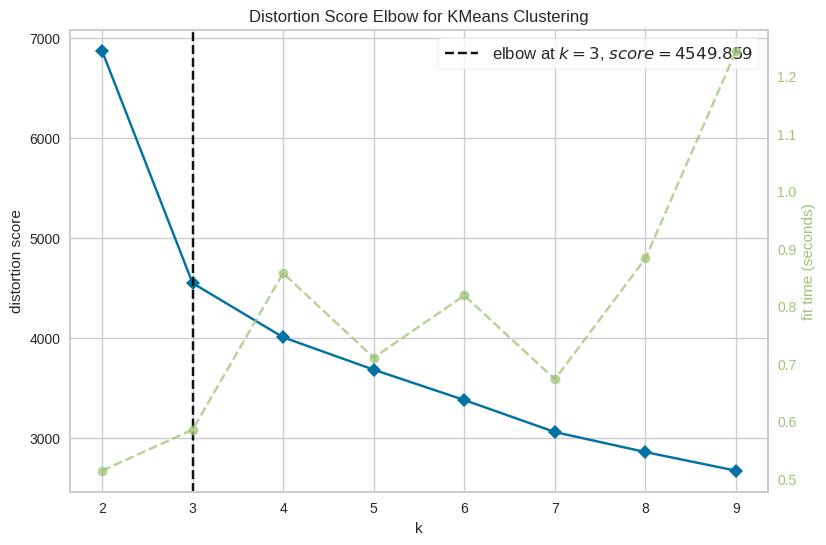

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [30]:
mpl.rcParams["figure.figsize"] = (9,6)
# Instantiation du modele et de la visualisation
model3 = KMeans(n_init=n_init, init=initialisation_modele)
visualizer = KElbowVisualizer(model3, k=(2,10))
visualizer.fit(variableIn)
visualizer.poof()    # affichage du graph

In [31]:
# d'après les graphiques précédents on choisi un nombre de 6 clusters
nbCluster=3

### Visualisation des silhouettes des clusters

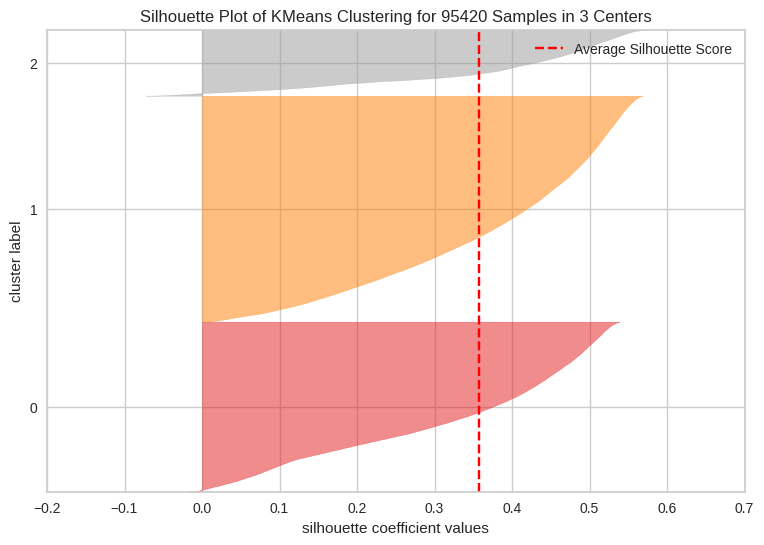

In [32]:
model3 = KMeans(n_clusters=nbCluster,
                n_init=n_init,
                init=initialisation_modele)
visualizer = SilhouetteVisualizer(model3)
visualizer.fit(variableIn)
bin = visualizer.poof()

> Nous pouvons observer sur ce graphe 3 clusters pas très homogènes en nombre d'individus avec peu d'erreurs de classification

### Modelisation

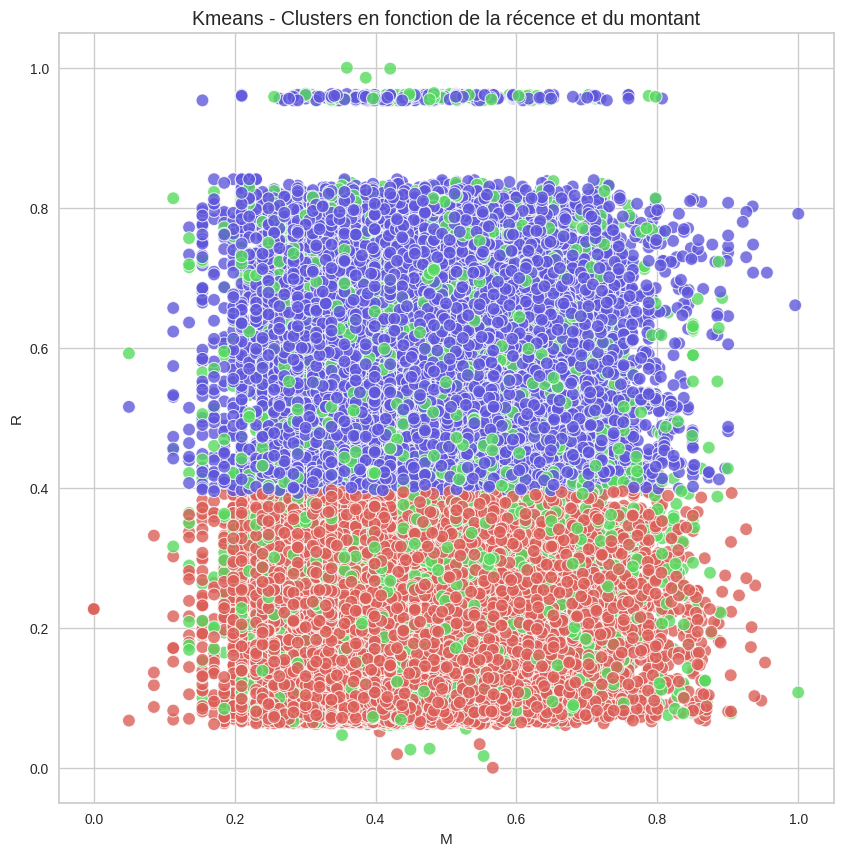

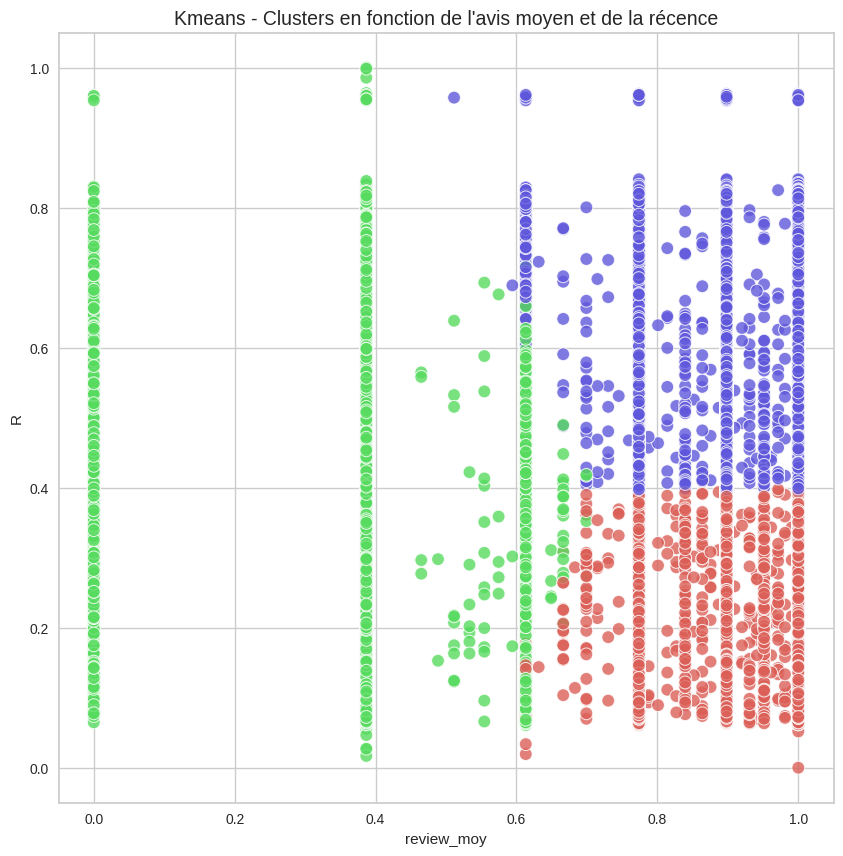

Cluster 0 --> 46576 individus
Cluster 1 --> 13621 individus
Cluster 2 --> 35223 individus


In [33]:
model3 = KMeans(nbCluster,
                n_init=n_init,
                init=initialisation_modele).fit(variableIn)
resultMod3 = model3.predict(variableIn)
colorGroup = sns.color_palette("hls", nbCluster)
colorsG = []
for groupe in resultMod3 :
    colorsG.append(colorGroup[groupe])

SortieModele3 = dfModele3.copy()
SortieModele3['Cluster']=resultMod3
SortieModele3['Colors']=colorsG

plotData(dfModele3, 'M', 'R', colors=colorsG,
         titre='Kmeans - Clusters en fonction de la récence et du montant')
plotData(dfModele3, 'review_moy', 'R', colors=colorsG,
         titre='Kmeans - Clusters en fonction de l\'avis moyen et de la récence')

for cluster in (np.sort(SortieModele3['Cluster'].unique())):
    individus = SortieModele3.loc[
                      SortieModele3['Cluster'] == cluster,'Cluster'].count()
    print(f'Cluster {cluster} --> {individus} individus')

### Visualisation 3d des clusters

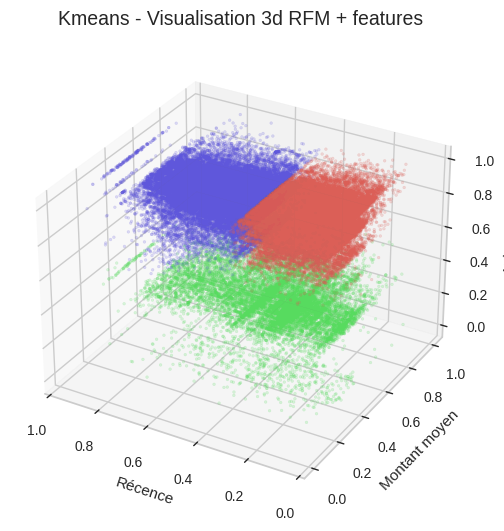

In [34]:
titre = "Kmeans - Visualisation 3d RFM + features"
f = plt.figure(figsize = (6,6))
f.set_figwidth = 20
f.set_figheight = 20
ax = f.add_subplot(projection='3d')
x = dfModele3['R']
y = dfModele3['M']
z = dfModele3['review_moy']

plt.title(titre, fontsize=14, pad=15)
ax.set_xlim(1,0)
scoreE = ax.scatter(x, y, z, color=colorsG, s=4, alpha=0.2)
ax.set_xlabel('Récence')
ax.set_ylabel('Montant moyen')
ax.set_zlabel('Avis moyen')
ax.xaxis.labelpad=8
ax.yaxis.labelpad=8
ax.zaxis.labelpad=8
ax.set_facecolor('white')
plt.savefig(dossierImage+titre+'.jpg')
plt.show()

> L'augmentation du nombre de features n'améliore pas le modèle